## The basics of data analysis

### What is SciPy?

SciPy (pronounced “Sigh Pie”) is a Python-based ecosystem of open-source software for mathematics, science, and engineering. In particular, these are some of the core packages (see https://www.scipy.org/)

* NumPy - Base N-dimensional array package
* SciPy - Fundamental library for scientific computing
* Matplotlib - Comprehensive 2D plotting
* IPython - Enhanced Interactive Console (Python version of Jupyter)
* Sympy - Symbolic mathematics
* pandas - Data structures, analysis and time series

### NumPy

NumPy is a key scientific computing library. At the core of NumPy are `ndarray` objects, which are n-dimensional arrays, such as vectors and matrices. Python already has structures like lists.

* NumPy arrays are of fixed size, whilst Python lists can dynamically grow
* Every element of a NumPy array need to have the same type, whilst Python lists can have mixed types
* We can run operations on an entire NumPy array far more efficiently than we can iterate through Python lists and apply operations on them.
* Many other Python packages, such as pandas, utilise NumPy arrays to faciliate the storage and manipulation of large datasets

Before using NumPy is is worth being familar with basic linear algebra concepts such as vectors and matrices, and how to do basic mathematical operations on them.

#### Vectorized vs for loops

* Unlike working with Python structures like lists, where we often have to use for loops, which are slow in Python, NumPy can use vectorized functions. 
* In practice, these vectorised functions often call low level C functions (where looping is much quicker!)
* The code is easier to read, but can sometimes take time to get used to if you haven't written vectorized code before.

If you've used languages like Matlab or R, you've probably done vectorization to make operators like matrix multiplication.

Let's create two big lists of integers.

In [1]:
lst1 = list(range(1, 100000))
lst2 = list(range(11, 100010))

Now multiply it using for loops

In [2]:
# slow way - elementwise multiplication in Python with for loops
lst_mult = []

for i, j in zip(lst1, lst2):
    lst_mult.append(i * j)

Let's try to do it using NumPy. First we need to import the NumPy library though and convert the lists in NumPy arrays.

## import numpy as np

lst1 = np.asarray(lst1)
lst2 = np.asarray(lst2)

It is faster using NumPy than for loops!

In [4]:
# fast way - vectorized multiplication with NumPy
lst_mult = lst1 * lst2

In [5]:
print(lst_mult)

# we can do all the familiar elementwise operations too (note we can use in place operators like += and *= too)
print(lst1 + lst2)
print(lst1 - lst2)
print(lst1 / lst2)

[        11         24         39 ... 1410465387 1410665392 1410865399]
[    12     14     16 ... 200004 200006 200008]
[-10 -10 -10 ... -10 -10 -10]
[0.09090909 0.16666667 0.23076923 ... 0.99990001 0.99990001 0.99990001]


#### Mathematical functions in NumPy narrays

We can also apply a large number of mathematical functions to NumPy arrays, similar to those available as built-in functions in Python. We shall illustrate a few of them here. A full list is available at https://docs.scipy.org/doc/numpy/reference/routines.math.html

In [6]:
print(lst1.sum()) # sum all the elements in the array
print(lst1.prod()) # multiply all the elements in the array
print(lst1.cumprod()) # cumulative product of the array
print((lst1 + 0.5).round()) # round the elements in the array

704982704
0
[1 2 6 ... 0 0 0]
[2.0000e+00 2.0000e+00 4.0000e+00 ... 9.9998e+04 9.9998e+04 1.0000e+05]


#### Properties of a NumPy narray

We can query each narray to understand how many elements it has, what is its shape and so on. We give some examples below.

In [7]:
a_vector = np.arange(15).reshape(1, 15) # create a vector with 15 entries from 0 to 15

print(a_vector)
print(a_vector.ndim) # how many dimensions has it got?
print(a_vector.shape) # what is the shape of the array?
print(a_vector.size) # what is the size?
print(a_vector.data) # where in the memory is the array?

[[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14]]
2
(1, 15)
15


#### Creating narrays and resizing

As well as converting a Python list to an narray, there are some other ways of creating new narrays. Obviously, we need to be careful when manipulating narrays, that they are of similar dimensions. For example, we can't do an elementwise additon between a (2x2) and a (3x2) narray.

In [8]:
print(np.zeros((2,3))) # create a 2x3 narray with zeros
print(np.ones((3,4))) # create a 3x4 narray with ones

a_vector = np.array([1,2,3,4]) # we can also create a narray directly
print(a_vector)

[[0. 0. 0.]
 [0. 0. 0.]]
[[1. 1. 1. 1.]
 [1. 1. 1. 1.]
 [1. 1. 1. 1.]]
[1 2 3 4]


We also show how to resize and concatenate arrays.

In [9]:
a_vector.resize(2,2) # resize our 1x4 narray into a 2x2 narray
a_matrix = a_vector.copy() # create a copy in memory of the narray
print(a_matrix)

a_vstacked_array = np.vstack((a_vector, a_vector)) # stack narrays vertically
a_hstacked_array = np.hstack((a_vector, a_vector)) # stack narrays horizontally
print(a_vstacked_array)
print(a_hstacked_array)

[[1 2]
 [3 4]]
[[1 2]
 [3 4]
 [1 2]
 [3 4]]
[[1 2 1 2]
 [3 4 3 4]]


The reverse of stacking narrays is splitting them.

In [10]:
print(np.vsplit(a_hstacked_array,2))
print(np.vsplit(a_vstacked_array,2))

[array([[1, 2, 1, 2]]), array([[3, 4, 3, 4]])]
[array([[1, 2],
       [3, 4]]), array([[1, 2],
       [3, 4]])]


We can use the `newaxis` function to increase the dimension of the narray.

In [11]:
from numpy import newaxis

higher_dimension = a_vector[:,newaxis]
print(higher_dimension) # increases the dimension of the narray

[[[1 2]]

 [[3 4]]]


As well as doing elementwise operations, we can also do matrix muliplication using the `@` operator for Python >= 3.5. For previous versions we have to use the `dot` function

In [12]:
print(a_matrix @ a_matrix)
print(a_matrix.dot(a_matrix))

[[ 7 10]
 [15 22]]
[[ 7 10]
 [15 22]]


The `axis` parameter can be used to apply operations across different dimensions.

In [13]:
print(a_matrix.sum(axis=0)) # sum across columns
print(a_matrix.sum(axis=1)) # sum across rows

[4 6]
[3 7]


#### Indexing and slicing

We can index and slice narrays fairly easily, in a similar to way to how we index and slice Python lists. When referencing the narray, the lowest dimensions are referered first, and the higher dimensions later.

In [14]:
print(a_matrix[0]) # get the first row
print(a_matrix[0,0]) # get top left corner
print(a_matrix[1,1]) # get bottom right corner
print(a_matrix[1]) # get the second row
print(a_matrix[-1]) # get last row

[1 2]
1
4
[3 4]
[3 4]


In [15]:
print(a_matrix.T[1]) # get second column (by transposing matrix first)
print(a_matrix[:,1]) # get second column (without transposing matrix)

[2 4]
[2 4]


#### datetime64

Typically, we use `datetime64` types in NumPy and pandas to represent date/time. These can give us nanosecond resolution for date/time values. Note, this is different to the nature Python `datetime` type. For more information about `datetime64`, see https://docs.scipy.org/doc/numpy/reference/arrays.datetime.html.

For a longer introduction to NumPy try https://numpy.org/devdocs/user/quickstart.html

### pandas (Python Data Analysis Library)

pandas is built on top of NumPy and provides ways of representating data structures like time series in Python. It is very useful for representing financial data, since so much financial data consists of time series.

#### Creating Series and DataFrame structures

As a first step we create a `Series` in pandas. If we do not provide an index, it creates a default integer index beginning at 0.

In [16]:
import pandas as pd

series = pd.Series(range(12,17))

print(series)

# generate a date index and a list of data points from 0 to 8
series_dates = pd.Series(index=pd.date_range(start='1-Jan-2018', periods=8), data=range(0,8))

print(series_dates)

0    12
1    13
2    14
3    15
4    16
dtype: int64
2018-01-01    0
2018-01-02    1
2018-01-03    2
2018-01-04    3
2018-01-05    4
2018-01-06    5
2018-01-07    6
2018-01-08    7
Freq: D, dtype: int64


The `DataFrame` structure gives us flexibility to have multiple columns, and we shall focus on using that throughout this tutorial. We'll create a `DataFrame` with two random columns.

In [17]:
df = pd.DataFrame(index=pd.date_range(start='1/1/2018', periods=8), 
                  data=np.random.rand(8,2), columns=['A', 'B'])

Once a `DataFrame` is created we can add new rows and columns too. `append` allows us to append another `DataFrame`, whilst `concat` can concatenate `DataFrame` across row or column axes.

In [18]:
df['C'] = np.random.rand(8,1) # add a new column

df1 = pd.DataFrame(index=pd.date_range(start='1/9/2018', periods=8), 
                   data=np.random.rand(8,3), columns=['A', 'B', 'C'])

df = df.append(df1)

print(df)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914
2018-01-03  0.763097  0.891281  0.482511
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
2018-01-06  0.345260  0.113679  0.265497
2018-01-07  0.820279  0.068762  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-11  0.864983  0.774386  0.139893
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372  0.923985  0.485075
2018-01-15  0.272819  0.484113  0.358273
2018-01-16  0.081230  0.275144  0.785514


Here we show how to replace individual elements.

In [19]:
df.at[df.index[-1], 'C'] = 1.0 # replace the last element in column C

We can also use `join` to combine together different `DataFrame` objects by their indices (or another column). We first create two `DataFrame` objects with similar dates, and then join them together. For dates which don't align, values are filled with `NaN`. We can also specify different types of join, that will just select common dates (ie. an inner join).

In [20]:
df_left = pd.DataFrame(index=pd.date_range(start='1/1/2018', periods=8), 
                       data=np.random.rand(8,2), columns=['A', 'B'])
df_right = pd.DataFrame(index=pd.date_range(start='1/3/2018', periods=8), 
                        data=np.random.rand(8,2), columns=['C', 'D'])

print(df_left)
print(df_right)

df_combined = df_left.join(df_right)

print(df_combined)

                   A         B
2018-01-01  0.904224  0.554216
2018-01-02  0.466167  0.687745
2018-01-03  0.520682  0.946703
2018-01-04  0.837897  0.619478
2018-01-05  0.635524  0.743660
2018-01-06  0.825844  0.791148
2018-01-07  0.608582  0.248145
2018-01-08  0.394426  0.391544
                   C         D
2018-01-03  0.712082  0.223223
2018-01-04  0.841374  0.784915
2018-01-05  0.991289  0.650841
2018-01-06  0.108304  0.942689
2018-01-07  0.309007  0.488826
2018-01-08  0.797586  0.880608
2018-01-09  0.353141  0.631401
2018-01-10  0.742570  0.815331
                   A         B         C         D
2018-01-01  0.904224  0.554216       NaN       NaN
2018-01-02  0.466167  0.687745       NaN       NaN
2018-01-03  0.520682  0.946703  0.712082  0.223223
2018-01-04  0.837897  0.619478  0.841374  0.784915
2018-01-05  0.635524  0.743660  0.991289  0.650841
2018-01-06  0.825844  0.791148  0.108304  0.942689
2018-01-07  0.608582  0.248145  0.309007  0.488826
2018-01-08  0.394426  0.391544  0.

We can also align `DataFrame` objects so they have the same axes. This can be useful, when it comes to doing mathematical functions between `DataFrame` objects.

In [21]:
df_left_align, df_right_align = df_left.align(df_right, axis=0) # align so they have the same rows

print(df_left_align)
print(df_right_align)

                   A         B
2018-01-01  0.904224  0.554216
2018-01-02  0.466167  0.687745
2018-01-03  0.520682  0.946703
2018-01-04  0.837897  0.619478
2018-01-05  0.635524  0.743660
2018-01-06  0.825844  0.791148
2018-01-07  0.608582  0.248145
2018-01-08  0.394426  0.391544
2018-01-09       NaN       NaN
2018-01-10       NaN       NaN
                   C         D
2018-01-01       NaN       NaN
2018-01-02       NaN       NaN
2018-01-03  0.712082  0.223223
2018-01-04  0.841374  0.784915
2018-01-05  0.991289  0.650841
2018-01-06  0.108304  0.942689
2018-01-07  0.309007  0.488826
2018-01-08  0.797586  0.880608
2018-01-09  0.353141  0.631401
2018-01-10  0.742570  0.815331


Note, that we can get access to the underlying `narray` object, by using `.values` for the data within a `DataFrame` and `.index` for the index column.

In [22]:
df_mult = df['A'] * df['B']

print(df_mult)
print(df_mult.index)
print(df_mult.values)

2018-01-01    0.013297
2018-01-02    0.328235
2018-01-03    0.680134
2018-01-04    0.253872
2018-01-05    0.057203
2018-01-06    0.039249
2018-01-07    0.056404
2018-01-08    0.079761
2018-01-09    0.549491
2018-01-10    0.047185
2018-01-11    0.669831
2018-01-12    0.078405
2018-01-13    0.080761
2018-01-14    0.905849
2018-01-15    0.132075
2018-01-16    0.022350
Freq: D, dtype: float64
DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07', '2018-01-08',
               '2018-01-09', '2018-01-10', '2018-01-11', '2018-01-12',
               '2018-01-13', '2018-01-14', '2018-01-15', '2018-01-16'],
              dtype='datetime64[ns]', freq='D')
[0.01329715 0.32823543 0.68013396 0.25387216 0.05720301 0.03924876
 0.05640413 0.07976107 0.54949139 0.04718468 0.66983128 0.07840493
 0.0807614  0.90584913 0.1320753  0.02234979]


#### Head and tail

We can grab the start and end rows using the `head` and `tail` functions, or indexing the rows directly.

In [23]:
print(df.head(2)) # get top 2 rows

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914


In [24]:
print(df.tail(3)) # get bottom 3 rows

                   A         B         C
2018-01-14  0.980372  0.923985  0.485075
2018-01-15  0.272819  0.484113  0.358273
2018-01-16  0.081230  0.275144  1.000000


#### Indexing and slicing

We can index and slice different parts of the `DataFrame` in a similar way to how we treat Python lists and narrays. We can also grab by column names and coordinates. pandas has also in the past used the `ix` keyword to index, which allows mixed label and integer indexing. However, since 0.20.0 it has been deprecated. Hence, we would recommend avoiding it.

In [25]:
print(df[0:2]) # get first 2 rows (like head function)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914


In [26]:
print(df[-3:]) # get last 3 rows (like tail function)

                   A         B         C
2018-01-14  0.980372  0.923985  0.485075
2018-01-15  0.272819  0.484113  0.358273
2018-01-16  0.081230  0.275144  1.000000


In [27]:
bool_filt = df.index > '01/03/2018' # create a boolean filter

print(bool_filt)

df_later = df[bool_filt] # only return those entries after 3rd Jan 2018

print(df_later)

[False False False  True  True  True  True  True  True  True  True  True
  True  True  True  True]
                   A         B         C
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
2018-01-06  0.345260  0.113679  0.265497
2018-01-07  0.820279  0.068762  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-11  0.864983  0.774386  0.139893
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372  0.923985  0.485075
2018-01-15  0.272819  0.484113  0.358273
2018-01-16  0.081230  0.275144  1.000000


In [28]:
print(df['C'].tail(2)) # another way to get column C (last 2 elements)
print(df.iloc[0,0]) # find a specific entry by coordinates

2018-01-15    0.358273
2018-01-16    1.000000
Freq: D, Name: C, dtype: float64
0.22667267220789322


#### Filling missing points

In real world datasets, there can be many missing points. These will generally represented by `NaN` values in pandas and NumPy. pandas let's us deal with these types of values.

In [29]:
df.at[df.index[[-2, 5]], 'B'] = np.nan # first make some values in column B NaN

print(df)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914
2018-01-03  0.763097  0.891281  0.482511
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
2018-01-06  0.345260       NaN  0.265497
2018-01-07  0.820279  0.068762  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-11  0.864983  0.774386  0.139893
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372  0.923985  0.485075
2018-01-15  0.272819       NaN  0.358273
2018-01-16  0.081230  0.275144  1.000000


We can choose to drop rows with NaN.

In [30]:
df = df.dropna()

print(df)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914
2018-01-03  0.763097  0.891281  0.482511
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
2018-01-07  0.820279  0.068762  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-11  0.864983  0.774386  0.139893
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372  0.923985  0.485075
2018-01-16  0.081230  0.275144  1.000000


In [31]:
df.at[df.index[[-2, 5]], 'B'] = np.nan # make some values in column B NaN again

df = df.fillna(method='ffill') # this time we will fill down NaN values

print(df) # note the repeats

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914
2018-01-03  0.763097  0.891281  0.482511
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
2018-01-07  0.820279  0.504151  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-11  0.864983  0.774386  0.139893
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372  0.159708  0.485075
2018-01-16  0.081230  0.275144  1.000000


In [32]:
df.at[df.index[[-2, 5]], 'B'] = np.nan # make some values in column B NaN again (!)

#### Filtering DataFrames

In many cases, we want to filter a DataFrame on many different criteria, to create different views of the same dataset. We can also filter by booleans. We'll try filtering based on the index.

In [33]:
df_filter = df[df.index > '2018-01-11']

print(df_filter)

                   A         B         C
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372       NaN  0.485075
2018-01-16  0.081230  0.275144  1.000000


In [34]:
bool_filt = df['C'] > 0.2

print(bool_filt)

2018-01-01     True
2018-01-02    False
2018-01-03     True
2018-01-04    False
2018-01-05     True
2018-01-07     True
2018-01-08     True
2018-01-09     True
2018-01-10     True
2018-01-11    False
2018-01-12     True
2018-01-13     True
2018-01-14     True
2018-01-16     True
Name: C, dtype: bool


Now try filtering on value in column C.

In [35]:
df_filter = df[bool_filt]

print(df_filter)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-03  0.763097  0.891281  0.482511
2018-01-05  0.113464  0.504151  0.337874
2018-01-07  0.820279       NaN  0.974327
2018-01-08  0.410130  0.194478  0.908388
2018-01-09  0.775171  0.708865  0.783152
2018-01-10  0.049041  0.962147  0.720653
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-14  0.980372       NaN  0.485075
2018-01-16  0.081230  0.275144  1.000000


We could also filter by multiple conditions.

In [36]:
df_filter = df[(df['C'] > 0.2) & (df['B'] < 0.3)]

print(df_filter)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-08  0.410130  0.194478  0.908388
2018-01-12  0.328657  0.238562  0.412402
2018-01-13  0.505682  0.159708  0.633931
2018-01-16  0.081230  0.275144  1.000000


#### Resampling

It is often the case that we want to resample data to a different time frequency. For example, we might have 1 minute data that we wish to convert into daily data. This aggregation, might involve taking the last value in each bar, the mean over the bar etc. For a reference of the various frequency keywords refer to https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases. Below to start with we create a random `DataFrame` with 2 columns of data with a 1 minute frequency. For a for explanation of the resample function see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.resample.html.

In [37]:
date_index = pd.date_range(start='01-Jan-2019', end='30-Jan-2019', freq='min')

data = np.random.rand(len(date_index),2)
df_intraday = pd.DataFrame(index=date_index, data=data, columns=['A_col', 'B_col'])

print(df_intraday.head(5))

                        A_col     B_col
2019-01-01 00:00:00  0.935388  0.822175
2019-01-01 00:01:00  0.704378  0.051614
2019-01-01 00:02:00  0.781682  0.402729
2019-01-01 00:03:00  0.214293  0.500246
2019-01-01 00:04:00  0.507057  0.116127


Next we show several ways to resample into hourly data.

In [38]:
df_hourly_last = df_intraday.resample('H').last() # get the last point in each hour
df_hourly_mean = df_intraday.resample('H').mean() # calculate the mean of every hourly bucket
df_hourly_ohlc = df_intraday.resample('H').ohlc() # show the open/high/low/close of every hourly bucket

print(df_hourly_last.head(3))
print(df_hourly_mean.head(3))
print(df_hourly_ohlc.head(3))

                        A_col     B_col
2019-01-01 00:00:00  0.535949  0.179669
2019-01-01 01:00:00  0.870675  0.618789
2019-01-01 02:00:00  0.515336  0.883823
                        A_col     B_col
2019-01-01 00:00:00  0.516370  0.517156
2019-01-01 01:00:00  0.522420  0.486976
2019-01-01 02:00:00  0.498312  0.537001
                        A_col                                   B_col  \
                         open      high       low     close      open   
2019-01-01 00:00:00  0.935388  0.990553  0.012886  0.535949  0.822175   
2019-01-01 01:00:00  0.569570  0.977009  0.012423  0.870675  0.114205   
2019-01-01 02:00:00  0.823562  0.999145  0.024477  0.515336  0.973967   

                                                   
                         high       low     close  
2019-01-01 00:00:00  0.986336  0.004746  0.179669  
2019-01-01 01:00:00  0.984020  0.039978  0.618789  
2019-01-01 02:00:00  0.992921  0.032694  0.883823  


#### Calculating basic statistics

pandas has many builtin functions that can be used to do statistical operations on a `DataFrame`. These include operations such as `sum`, `mean`, `max`, `min` etc. A full list of these functions (and many more) that can be applied to a `DataFrame` can be found at https://pandas.pydata.org/pandas-docs/stable/reference/frame.html

In [39]:
df_sum_columns = df.sum(axis=0) # when we run mathematical operations in pandas, it will ignore NaNs (unlike NumPy)
df_sum_rows = df.sum(axis=1)
df_std_columns = df.std(axis=0) # do the standard deviation of a whole column
df_std_rows = df.std(axis=1) # do the standard deviation of a whole row

print(df_sum_columns)
print(df_sum_rows.head(3))
print(df_std_columns)
print(df_std_rows.head(3))

A    6.878411
B    6.083650
C    7.883814
dtype: float64
2018-01-01    1.129963
2018-01-02    1.162864
2018-01-03    2.136889
dtype: float64
A    0.316995
B    0.316594
C    0.325568
dtype: float64
2018-01-01    0.413892
2018-01-02    0.335007
2018-01-03    0.209067
dtype: float64


As well as applying these computations to entire rows and columns, we can also do them on a rolling basis, using `rolling` (see https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rolling.html).

In [40]:
df_rolling_sma = df.rolling(5, min_periods=1).mean() # calculate rolling 5D moving average

print(df_rolling_sma)

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.435974  0.283668  0.426771
2018-01-03  0.545015  0.486206  0.445351
2018-01-04  0.487351  0.566552  0.372030
2018-01-05  0.412573  0.554072  0.365199
2018-01-07  0.531295  0.677925  0.391138
2018-01-08  0.484265  0.599375  0.571033
2018-01-09  0.486680  0.553771  0.631162
2018-01-10  0.433617  0.592410  0.744879
2018-01-11  0.583921  0.659969  0.705282
2018-01-12  0.485596  0.575688  0.592898
2018-01-13  0.504707  0.568734  0.538006
2018-01-14  0.545747  0.533701  0.478391
2018-01-16  0.552185  0.361950  0.534260


We can also calculate many basic statistics in one go with the describe function.

In [41]:
df.describe()

,A,B,C
count,14.000000,12.000000,14.000000
mean,0.491315,0.506971,0.563130
std,0.316995,0.316594,0.325568
min,0.049041,0.058662,0.008914
25%,0.248594,0.227541,0.356506
50%,0.457906,0.506413,0.559503
75%,0.772152,0.782687,0.829259
max,0.980372,0.962147,1.000000


#### Working with strings

Pandas DataFrames can also hold string data too. Let's create a random DataFrame with integers between 0 and 10



In [42]:
import pandas as pd
import numpy as np

daily_index = pd.date_range(start='01-Jan-2019', end='30-Jan-2019', freq='D')

data = np.random.randint(10, size=(len(daily_index),3))
df_daily = pd.DataFrame(index=daily_index, data=data, columns=['A_col', 'B_col', 'C_col'])

print(df_daily.head(5))

            A_col  B_col  C_col
2019-01-01      4      1      8
2019-01-02      9      1      9
2019-01-03      8      7      5
2019-01-04      6      3      7
2019-01-05      8      3      6


Replace the numbers with the associated words in the B_col, using the replace function.

In [43]:
number_words = {0 : "zero", 1 : "one", 2 : "two", 3 : "three", 4 : "four", 5 : "five", 6 : "six", 7 : "seven",
               8 : "eight", 9 : "nine", 10 : "ten"}

df_daily[['A_col', 'B_col']] = df_daily[['A_col', 'B_col']].replace(number_words)

print(df_daily.head(5))

            A_col  B_col  C_col
2019-01-01   four    one      8
2019-01-02   nine    one      9
2019-01-03  eight  seven      5
2019-01-04    six  three      7
2019-01-05  eight  three      6


We can see the underlying datatypes inside the DataFrame for each column, we now have objects and integers.

In [44]:
print(df_daily.dtypes)

A_col    object
B_col    object
C_col     int32
dtype: object


With strings, we might want to get the potentional values for each column (doesn't make much sense for continuous quantities like floats).

In [45]:
print(df_daily['A_col'].unique())

['four' 'nine' 'eight' 'six' 'one' 'five' 'three' 'seven' 'two' 'zero']


We can create a crosstab style representation of data which has a large amount of strings.

In [46]:
pd.crosstab(df_daily['A_col'], df_daily['B_col'])

B_col,eight,five,four,nine,one,seven,six,three,two,zero
A_col,,,,,,,,,,
eight,1,0,0,0,0,1,0,1,0,0
five,0,0,1,1,0,0,0,0,0,0
four,0,0,0,0,1,1,0,1,0,0
nine,0,0,0,0,2,0,0,0,0,1
one,1,0,1,1,0,0,1,1,1,0
seven,0,0,0,1,0,0,0,1,0,0
six,0,1,0,0,0,0,0,1,0,0
three,0,0,0,1,0,0,1,0,0,3
two,0,0,1,0,0,0,0,0,1,0


#### Converting DataFrames to other Python objects

We can convert Pandas DataFrames to other Python objects like dictionaries. We can also create Pandas DataFrames from dictionaries too.

#### GroupBy objects

The groupby funciton allows us to group various parts of the DataFrame, and then perform operations per group. Let's say we want to groupby the values of A_col. Printing the result of the groupby function, just returns a DataFrameGroupBy object.

In [47]:
df_group = df_daily.groupby('A_col')

print(df_group)

That doesn't appear that useful. However, we can view the groups directly, which looks quite a bit clearer!

In [48]:
df_group.groups

{'eight': [2019-01-03 00:00:00, 2019-01-05 00:00:00, 2019-01-26 00:00:00], 'five': [2019-01-09 00:00:00, 2019-01-19 00:00:00], 'four': [2019-01-01 00:00:00, 2019-01-06 00:00:00, 2019-01-07 00:00:00], 'nine': [2019-01-02 00:00:00, 2019-01-21 00:00:00, 2019-01-30 00:00:00], 'one': [2019-01-08 00:00:00, 2019-01-12 00:00:00, 2019-01-22 00:00:00, 2019-01-25 00:00:00, 2019-01-27 00:00:00, 2019-01-29 00:00:00], 'seven': [2019-01-13 00:00:00, 2019-01-18 00:00:00], 'six': [2019-01-04 00:00:00, 2019-01-11 00:00:00], 'three': [2019-01-10 00:00:00, 2019-01-14 00:00:00, 2019-01-15 00:00:00, 2019-01-16 00:00:00, 2019-01-24 00:00:00], 'two': [2019-01-17 00:00:00, 2019-01-20 00:00:00], 'zero': [2019-01-23 00:00:00, 2019-01-28 00:00:00]}

We can then perform summary like operations on the DataFrameGroupBy operation, such as count and sum.

In [49]:
print(df_group.count())

       B_col  C_col
A_col              
eight      3      3
five       2      2
four       3      3
nine       3      3
one        6      6
seven      2      2
six        2      2
three      5      5
two        2      2
zero       2      2


In [50]:
print(df_group.sum())

       C_col
A_col       
eight     12
five       7
four      14
nine      14
one       34
seven     12
six       12
three     16
two       12
zero       3


We can also perform multiple functions at once, even NumPy functions.

In [51]:
print(df_group.agg([np.mean, np.sum]))

          C_col    
           mean sum
A_col              
eight  4.000000  12
five   3.500000   7
four   4.666667  14
nine   4.666667  14
one    5.666667  34
seven  6.000000  12
six    6.000000  12
three  3.200000  16
two    6.000000  12
zero   1.500000   3


We can also group by multiple columns too.

In [52]:
df_group = df_daily.groupby(['A_col', 'B_col'])

print(df_group.groups)

{('eight', 'eight'): [2019-01-26 00:00:00], ('eight', 'seven'): [2019-01-03 00:00:00], ('eight', 'three'): [2019-01-05 00:00:00], ('five', 'four'): [2019-01-19 00:00:00], ('five', 'nine'): [2019-01-09 00:00:00], ('four', 'one'): [2019-01-01 00:00:00], ('four', 'seven'): [2019-01-06 00:00:00], ('four', 'three'): [2019-01-07 00:00:00], ('nine', 'one'): [2019-01-02 00:00:00, 2019-01-21 00:00:00], ('nine', 'zero'): [2019-01-30 00:00:00], ('one', 'eight'): [2019-01-25 00:00:00], ('one', 'four'): [2019-01-29 00:00:00], ('one', 'nine'): [2019-01-08 00:00:00], ('one', 'six'): [2019-01-22 00:00:00], ('one', 'three'): [2019-01-12 00:00:00], ('one', 'two'): [2019-01-27 00:00:00], ('seven', 'nine'): [2019-01-18 00:00:00], ('seven', 'three'): [2019-01-13 00:00:00], ('six', 'five'): [2019-01-11 00:00:00], ('six', 'three'): [2019-01-04 00:00:00], ('three', 'nine'): [2019-01-15 00:00:00], ('three', 'six'): [2019-01-24 00:00:00], ('three', 'zero'): [2019-01-10 00:00:00, 2019-01-14 00:00:00, 2019-01-16 

We can grab individual groups from that. For example, here getting every element with 'one' in A_col and 'one' in B_col. This might sometimes fail, given we are looking at random combinations.

In [53]:
try:
    print(df_group.get_group(('one', ('one'))))
except:
    pass

#### Reading and writing from disk

In many cases, we shall want to read and write data from pandas from disk. pandas supports many different formats including CSV, HDF5, parquet etc. We should be careful to make sure that any dates are converted to the appropriate date/time format used in pandas.

In [54]:
df.to_csv('random.csv') # write to a CSV file
df.to_excel('random.xlsx') # write to an XLSX file for Excel

df_csv = pd.read_csv('random.csv', index_col=0) # read back the CSV to pandas, assuming 1st col is the index

df_csv.index = pd.to_datetime(df_csv.index) # make sure the index is converted to datetime64 format.

print(df_csv.head(5))
print(df_csv.index) # check 

                   A         B         C
2018-01-01  0.226673  0.058662  0.844628
2018-01-02  0.645276  0.508675  0.008914
2018-01-03  0.763097  0.891281  0.482511
2018-01-04  0.314357  0.807591  0.152067
2018-01-05  0.113464  0.504151  0.337874
DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-07', '2018-01-08', '2018-01-09',
               '2018-01-10', '2018-01-11', '2018-01-12', '2018-01-13',
               '2018-01-14', '2018-01-16'],
              dtype='datetime64[ns]', freq=None)


#### Plotting

We can quickly plot `DataFrame` objects using matplotlib in one line. We shall later discuss visualization in Python in more detail.

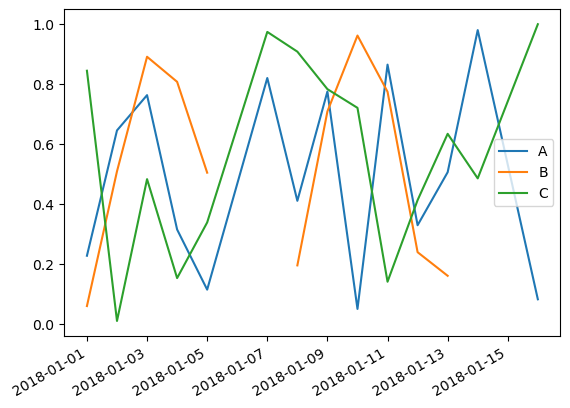

In [55]:
%matplotlib inline
import matplotlib as mpl

mpl.style.use('default')

df.plot();

We can also plot as a bar chart and change the theme to one that looks like `ggplot` from R.

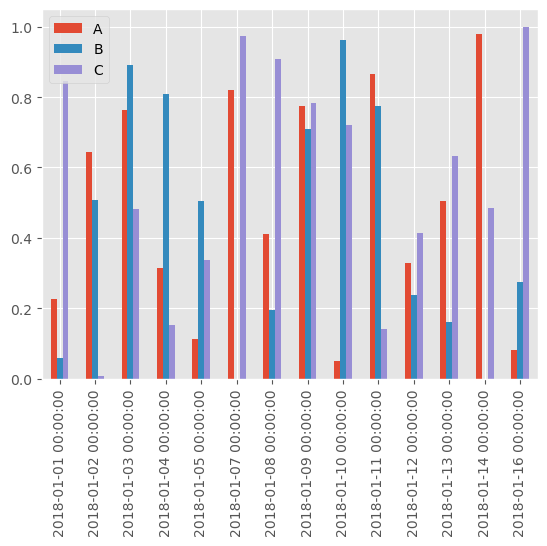

In [56]:
mpl.style.use('ggplot')
df.plot(kind='bar');

## Visualisation

An important part of many data analysis tasks is the presentation of the results. In many cases, simply presenting very large tables can make it difficult to interpret the data. Thankfully, Python has many visualisation tools to help us present our data. In this section we shall discuss several different Python visualisation libraries and how to use them.

### Matplotlib

Matplotlib is the oldest and most well know of all the Python based visualisation libraries. We already saw earlier that Pandas can directly plot charts using Matplotlib. Here we'll learn how to make some ourselves. The general idea is that we have a `Figure` object on which to draw on. On top of that we have `Axes` objects on which we have plots. We can think of `Figure` and `Axes` as containers on which we'll draw lots of other objects like `Line2D` and bascially anything else you would see on a chart. We can have several plots on the same `Figure`. We'll try to give a few examples of Matplotlib charts.

In [57]:
import pandas as pd
import numpy as np

date_index = pd.date_range(start='01-Jan-2019', end='30-Jan-2019', freq='D')

data = np.random.randint(0, 10, size=(len(date_index),2))
df_burger_ratings = pd.DataFrame(index=date_index, data=data, columns=['KFC', 'Burger King'])
df_burger_ratings.index.name = 'Date'

Need to import the matplotlib and also make charts in line, so they show in the Jupyter notebook, as opposed to a separate screen. `matplotlib.pyplot` makes Matplotlib work in a similar way to Matlab plotting (don't worry though if you've never used Matlab!). You may need to update your version of Matplotlib using:
 
    conda install matplotlib --force

In [58]:
%matplotlib inline

import matplotlib.pyplot as plt
plt.style.use('default') # changes the matplotlibplot style...

#### Plotting line charts

Whilst we have used the 'default' style, there are many other themes, a full list is at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html. Let's do a line chart in Matplotlib, setting various properties like the axes labels and also including the legend.

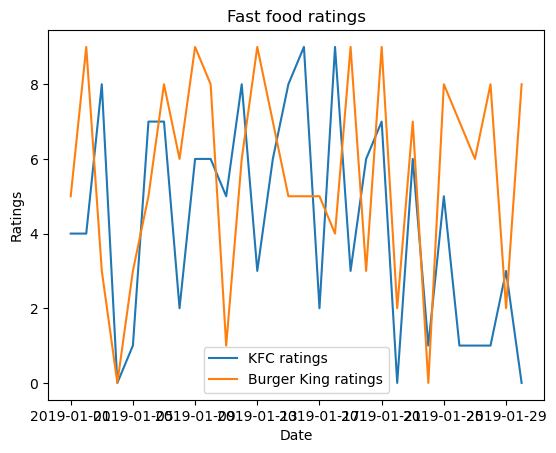

In [59]:
plt.figure() # create an empty figure to draw on
plt.plot(df_burger_ratings.index, df_burger_ratings['KFC'], label='KFC ratings')
plt.plot(df_burger_ratings.index, df_burger_ratings['Burger King'], label='Burger King ratings')

plt.xlabel('Date')
plt.ylabel('Ratings')
plt.title("Fast food ratings")
plt.legend()

plt.show() # this will render the chart after we've added all the elements

#### Formating dates

We can plot it in a different way collecting the `Axis` object. Let's also tidy the chart, by setting the axis interval.

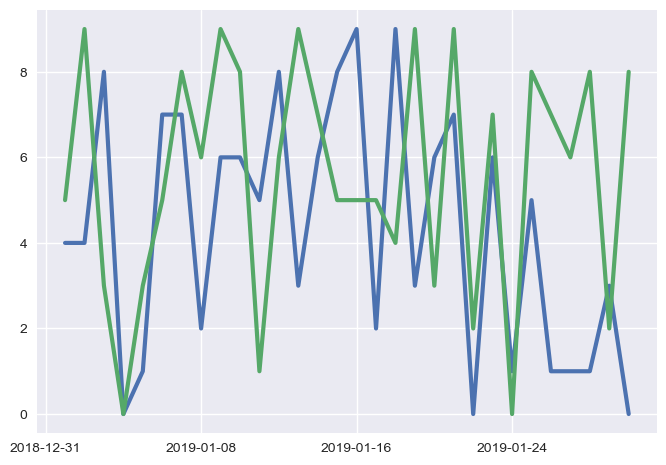

In [60]:
plt.style.use('seaborn') # changes the matplotlibplot style...

fig, ax = plt.subplots()
ax.plot(df_burger_ratings.index, df_burger_ratings, **{'marker': 'x', 'linewidth' : 3})
ax.xaxis.set_major_locator(plt.MaxNLocator(4)) # reduce the number of ticks!
plt.show()

#### Fill charts

We can represent the same data in a fill chart.

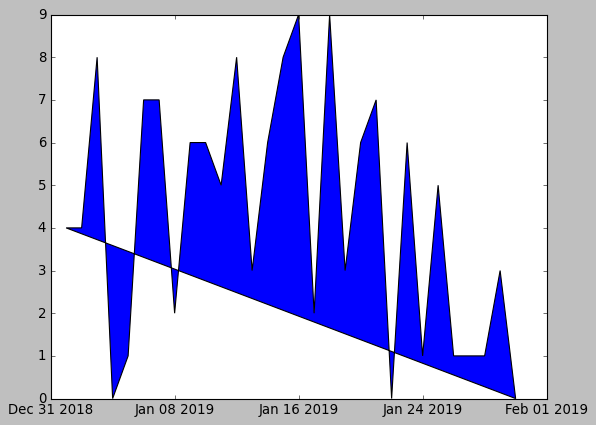

In [61]:
plt.style.use('classic') # changes the matplotlibplot to classic.. not that nice!

fig, ax = plt.subplots()
ax.fill(df_burger_ratings.index, df_burger_ratings['KFC'])
ax.xaxis.set_major_locator(plt.MaxNLocator(4)) # reduce the number of ticks!
plt.show()

#### Subplots

It is possible to combine several subplots on the same `Figure`.

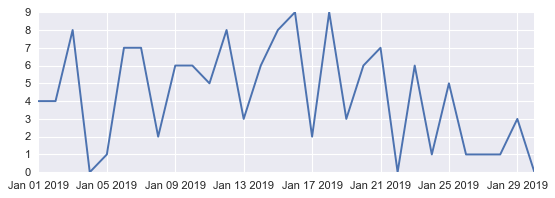

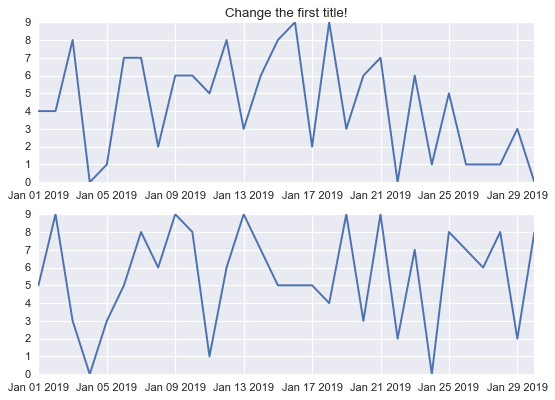

In [62]:
plt.style.use('seaborn') # changes the matplotlibplot style...

# create a figure with two subplots
plt.figure(1)
plt.subplot(211)
plt.plot(df_burger_ratings.index, df_burger_ratings['KFC'], label='KFC ratings')

plt.subplot(212)
plt.plot(df_burger_ratings.index, df_burger_ratings['Burger King'], label='Burger King ratings')

# create a second figure with 1 subplot
plt.figure(2)
plt.subplot(211)
plt.plot(df_burger_ratings.index, df_burger_ratings['KFC'], label='KFC ratings')

# grab the 1st figure and the first subplot of that, and change the title!
plt.figure(1)
plt.subplot(211)
plt.title("Change the first title!")

plt.show()

#### Scatter charts

We can also do scatter charts. As well as setting the x and y coordiantes, we can also change the size and colour of each point, so we can display more information. In this case, we'll make the darkness of the color related to the Shake Shack rating and the size of each point for the McDonalds rating.

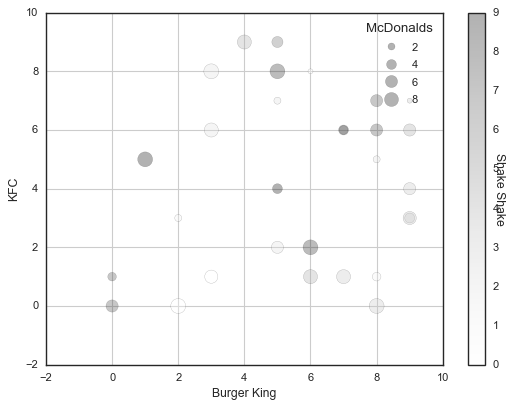

In [63]:
plt.style.use('seaborn-white') # changes the matplotlibplot style...

# add a few other ratings for other fast food outlets
df_burger_ratings['McDonalds'] = np.random.randint(0, 10, size=(len(date_index),1))
df_burger_ratings['Shake Shake'] = np.random.randint(0, 10, size=(len(date_index),1))

fig, ax = plt.subplots()

# make McDonalds rating related to size
scale = 20.0 * df_burger_ratings['McDonalds']

labels = ['Tiny', 'Small', 'Medium', 'Large', 'Huge']

scatter = ax.scatter(df_burger_ratings['Burger King'], df_burger_ratings['KFC'], 
                     c=df_burger_ratings['Shake Shake'], # want the color to be related to Shake Shake rating
                s=scale, 
                cmap='Greys', # full list of colormaps at https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html
                alpha=0.3)

cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Shake Shake', rotation=270)

plt.xlabel('Burger King')
plt.ylabel('KFC')

# ax.legend()

# note: needs matplotlib 3.1.0
# create a size legend for McDonalds
handles, labels = scatter.legend_elements(prop="sizes")
kw = dict(prop="sizes", num=5, func=lambda s: s/20.0)

legend = ax.legend(*scatter.legend_elements(**kw), loc="upper right", title="McDonalds")

ax.grid(True)

plt.show()

#### 3D scatter charts

Another way to represent some of this data is using a 3D scatter plot.

C:\Users\saeed\DOCUME~1\MobaXterm\slash\var\log\xwin/ipykernel_34388/3790445190.py:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


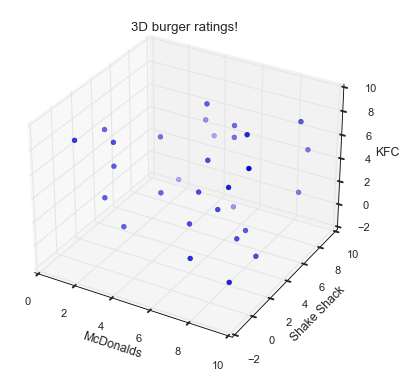

In [64]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure()
ax = fig.gca(projection='3d')

ax.scatter(df_burger_ratings['McDonalds'], df_burger_ratings['Shake Shake'], df_burger_ratings['KFC'])

ax.set_xlabel('McDonalds')
ax.set_ylabel('Shake Shack')
ax.set_zlabel('KFC')

plt.title("3D burger ratings!")

plt.show()

### Seaborn

Seaborn is a Python library which is effectively a wrapper on top matplotlib, which makes it easier to use, and adds additional functionality on top of it. Seaborn tries to make it easy to switch between different visualisations of the same dataset. We need to make sure that the DataFrame we are plotting is in a tidy format for Seaborn (see https://www.jeannicholashould.com/tidy-data-in-python.html). 

The tidy structure is as follows:

* Each variable forms a column and contains values
* Each observation forms a row
* Each type of observational unit forms a table

Let's first import the library.

In [65]:
import seaborn as sns
sns.set()

We can do a line chart, quite easily in Seaborn. Note that we need to first reset the index to get it into the right format for Seaborn.

In [66]:
df_burger_ratings_reset = df_burger_ratings.reset_index()

#### Line charts

Now we can plot it, using the `relplot` function of Seaborn. We can fall back into using some Matplotlib functionality to make sure the dates are properly formatted, so they look neat.

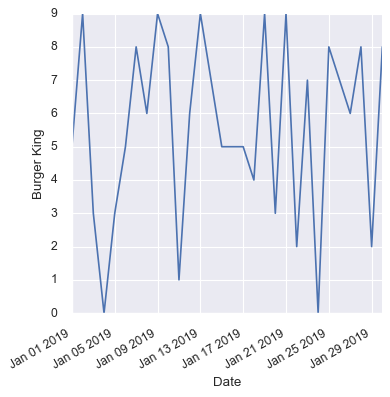

In [67]:
chart = sns.relplot(x='Date', y="Burger King",
            kind="line", legend="full", data=df_burger_ratings_reset);

chart.fig.autofmt_xdate()

#### Scatter charts

We can also revisit our mulitple dimension burger ratings plot. This time, it's much quicker using Seaborn, than using Matplotlib directly!

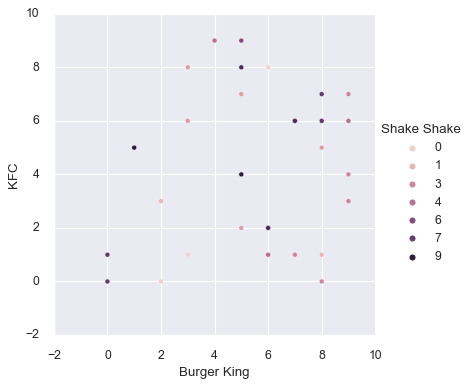

In [68]:
sns.relplot(x="Burger King", y="KFC", hue='Shake Shake', data=df_burger_ratings);

There are a number of demo datasets available in Seaborn. We'll get the restaurant 'tips' dataset. We print it, to illustrate the tidy format.

In [69]:
tips = sns.load_dataset("tips")

print(tips)

     total_bill   tip     sex smoker   day    time  size
0         16.99  1.01  Female     No   Sun  Dinner     2
1         10.34  1.66    Male     No   Sun  Dinner     3
2         21.01  3.50    Male     No   Sun  Dinner     3
3         23.68  3.31    Male     No   Sun  Dinner     2
4         24.59  3.61  Female     No   Sun  Dinner     4
..          ...   ...     ...    ...   ...     ...   ...
239       29.03  5.92    Male     No   Sat  Dinner     3
240       27.18  2.00  Female    Yes   Sat  Dinner     2
241       22.67  2.00    Male    Yes   Sat  Dinner     2
242       17.82  1.75    Male     No   Sat  Dinner     2
243       18.78  3.00  Female     No  Thur  Dinner     2

[244 rows x 7 columns]


We have lots of variables, we might want on the plot. The total bill and tip size are numerical, as is the size of the dining group. Meanwhile the other variables, like smoker and time are categorical. Hence, to plot it we need to have an ability to plot different colours, sizes etc. We can do that in just one line of code with Seaborn (compare that with Matplotlib earlier!)

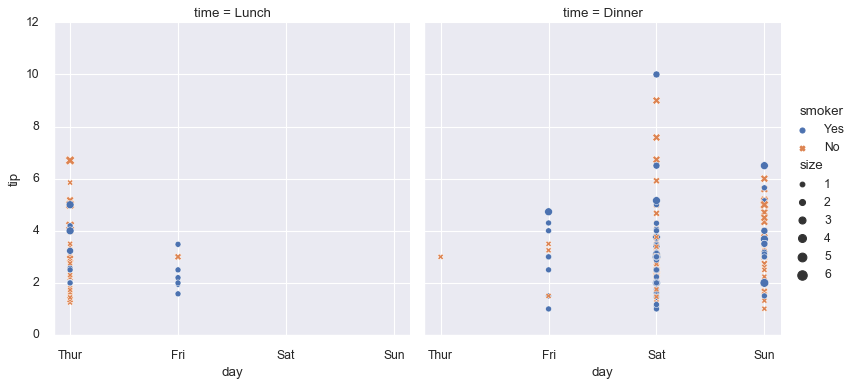

In [70]:
sns.relplot(x="day", y="tip", col="time",
            hue="smoker", style="smoker", size="size",
            data=tips);

### Plotly

Plotly is another visualization library, which allows you to create interactive web based plots. You can use it create online plots, which are placed on Plotly's websites (think of it like Instagram but for charts) or an internal Plotly server. You can choose to make your online charts public, so everyone can view them, or private to restrict access. This online functionality make it easier to share plots with others. However, in practice, it is likely that you'll use Plotly in offline mode, which are not uploaded to the web. We'll mostly demonstrate using online Plotly.

You may need to install Plotly and Plotly Express (this will install Plotly 4.9.0 and Plotly Express), if it isn't already installed. Plotly Express is an easy to use wrapper for Plotly, which simplifies the syntax considerably. If you want to have more control of your Plotly charts, you will likely need to use the lower level syntax.

    conda install -c plotly plotly=4.9.0
    
We shall be using Plotly 4. Once we have installed Plotly and Plotly Express, we need to make a few imports. In Plotly 4, the online functionality has been spun out into the `chart_studio` package (which we won't be using here).

As a first step we need to import a few Plotly libraries, that we'll use later.

In [2]:
import pandas as pd
import numpy as np
import plotly.offline as py_offline
from plotly.offline import download_plotlyjs, init_notebook_mode
init_notebook_mode(True)
import plotly.express as px
import plotly.graph_objects as go
try:
    # Plotly 4 onwards
    # import chart_studio.plotly as py
    import plotly.express as px
    import plotly.graph_objects as go
except:
    
    import plotly_express as px
    import plotly.plotly as py
    import plotly.graph_objs as go

There are many different types of renderer for Plotly, which we can choose (usually it will pick one for us otherwise). Note, to create static images (eg. SVG or PNG), you need to have plotly-orca installed, which can be done via conda.

        conda install -c plotly plotly-orca
        
Usually, an interactive JavaScript Plotly plot is best (ie. 'notebook' when using in Jupyter notebooks). However, note that when reopening the Jupyter notebook, the interactive plots will disappear, and will only reappear once you re-run the code which generated them. Try to play around with the settings and see the difference. If we see the renderer as PNG it won't disappear (and the notebook files are a lot smaller then!), but the charts won't be interactive then.

In [1]:
import plotly.io as pio
pio.renderers.default = "notebook"
# pio.renderers.default = "svg"
# pio.renderers.default = "png"
    
# py_offline.init_notebook_mode() # for plotly before 4.0 to ensure plot is published in Jupyter notebook

Let's start by creating some charts using the lower level Plotly API in Python. There are lots of Plotly APIs for other languages including Matlab and R.

The way Plotly works is that a JSON object is initially constructed by the Python API. This JSON object is rendered by the PlotlyJS, which is a JavaScript based plotting engine that can be used in a web browser. We don't actually need to know any JavaScript ourselves to use Plotly. JSON is just a specific type of format to represent data, which is written in plain text, just like HTML (although it is possible to construct binary JSON objects too). Below we give a very simple example of a JSON object. In practice, the JSON generated by Plotly is a lot more complex. Whilst, it might be possible to manually construct the Plotly JSON, without any special API, it 

    {
    "burgers":[
        {"type":"Whopper", "cheese":"Cheddar"}, 
        {"type":"Big Mac", "cheese":"Brie"},
    ]
    }

Let's create a DataFrame first that we can use to plot.

In [3]:
date_index = pd.date_range(start='01-Jan-2019', end='30-Jan-2019', freq='B')

data = np.random.randint(0, 5, size=(len(date_index),2))
df_burger_consume = pd.DataFrame(index=date_index, data=data, columns=['Whopper', 'Big Mac'])
df_burger_consume.index.name = 'Date'

#### Line charts with lower level API

Next we can create a Plotly chart using the lower level API.

In [74]:
# create figure
fig = go.Figure(
    layout=go.Layout(
        # title=go.layout.Title(text="Time for Burgers")
    )
)

for c in df_burger_consume.columns:
    fig.add_trace(go.Scatter(x=df_burger_consume.index, y=df_burger_consume[c],
                        mode='lines',
                        name=c))
    
# update a property later
try:
    # Plotly 4 has a simpler way to update properties
    fig.update_layout(title='Just another burger ',
                xaxis_title='Number of burgers eaten',
                yaxis_title='Date',
                   )
except:
    # earlier versions of Plotly
    fig.update(dict(layout=dict(yaxis_title='Date', xaxis_title='Number of burgers eaten')))

fig.show()

We can print the first part of the Figure object. As we noted earlier, underneath it is defined as a JSON object.

In [75]:
print(str(fig)[0:500])

Figure({
    'data': [{'mode': 'lines',
              'name': 'Whopper',
              'type': 'scatter',
              'x': array([datetime.datetime(2019, 1, 1, 0, 0),
                          datetime.datetime(2019, 1, 2, 0, 0),
                          datetime.datetime(2019, 1, 3, 0, 0),
                          datetime.datetime(2019, 1, 4, 0, 0),
                          datetime.datetime(2019, 1, 7, 0, 0),
                          datetime.datetime(2019, 1, 8, 0, 0),
                


#### Plotting bar charts directly using JSON vs Plotly API

We can create many other types of charts with Plotly including bar charts. We shall try creating the same bar chart using two different ways, directly by defining the JSON and the second way using the Plotly API.

In [76]:
fig = go.Figure({
    "data": [{"type": "bar",
              "x": ["Big Mac", "Whopper", "Honest Burgers"],
              "y": [1, 5, 2]}],
    "layout": {"title": {"text": "Burger score (from JSON)"}}
})

fig.show()

In [77]:
fig = go.Figure(
    data=[go.Bar(x=["Big Mac", "Whopper", "Honest Burgers"], y=[1, 5, 2])],
    layout=go.Layout())

# another way to set properties...
fig.layout.title.text = "A simpler way to set properties?"

fig.show()

#### Controlling the formatting of charts

We can control the formatting of the charts in many ways including specifying the colour. In this example, we'll show the various types of line charts we can create, we'll vary several properties:

* color
* dashing
* shape ie. interpolation
* line width
* mode ie. line or markers (or both)

First, let's set up some of the properties.

In [78]:
import random

month = ['January', 'February', 'March', 'April', 'May', 'June', 'July',
         'August', 'September', 'October', 'November', 'December']

fig = go.Figure()

color = ['firebrick', 'green', 'red', 'blue']
dash = ['dot', 'dash', 'dashdot', 'dash']
shape = ['hv', 'vh', 'hvh', 'spline']
mode = ['lines', 'lines+markers', 'markers', 'lines']
width = [1, 3, 4, 7]
year = [2003, 2004, 2005, 2006]

Let's create and style traces, specifying the properties.

In [79]:
for i in range(0, 4):
    rand_burger = random.sample(range(1,100), 10)
    fig.add_trace(go.Scatter(x=month, y=rand_burger, name=year[i], mode=mode[i],
                             line=dict(color=color[i], width=width[i], dash=dash[i], 
                                       shape=shape[i])))


For Plotly 4 and later, we can update the layout using update_layout style syntax (note, won't work with earlier versions)

In [80]:
try:
    # Edit the layout
    fig.update_layout(title='Total number of burgers consumed by year',
                       xaxis_title='Month',
                       yaxis_title='Thousands of burgers')
except:
    pass

Finally, let's show the plot!

In [81]:
fig.show()

#### Realtime charts

So far we've only looked at data which has static data. However, what if we want to update the data for a Plotly chart? We can do so using the FigureWidget object.

In [4]:
f = go.FigureWidget()

Let's now display the axis, which appears empty.

In [5]:
f

FigureWidget({
    'data': [], 'layout': {'template': '...'}
})

We'll see the above chart updating, when we add elements.

In [6]:
f.layout.title = 'Burgers eaten today'

Let's add a line chart.

In [7]:
f.add_scatter(y=[2, 1, 4, 3]);

Now add a bar chart.

In [8]:
f.add_bar(y=[1, 4, 3, 2]);

We can set the series names too.

In [9]:
f.data[0].name = 'Burgers eaten by Saeed'
f.data[1].name = 'Burgers eaten by everyone else'

What about updating the data, to simulate changes throughout the day for burger consumption...!

In [10]:
import time
import random

bar = f.data[1]

for i in range(0, 10):
    time.sleep(1)
    bar.y = [x + random.randint(1,5) for x in bar.y]
    
    f.layout.title = 'Burgers eaten today at time = ' + str(i) 
    

#### Candlesticks charts

In finance, candlesticks are commonly used. They were invented originally in Japan. They can show us the open, high, low and closing prices in one go. When the candlestick is filled, it means the price has gone down (or is red). We then candlestick is lighter (or is green), it means the price has gone up. These can be plotted in Plotly, without too much difficulty. OHLC charts are similar (open, high, low and close).

In [89]:
import pandas as pd
from datetime import datetime

df_apple = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')

fig = go.Figure(data=[go.Candlestick(x=df_apple['Date'],
                open=df_apple['AAPL.Open'],
                high=df_apple['AAPL.High'],
                low=df_apple['AAPL.Low'],
                close=df_apple['AAPL.Close'])])

fig.show()

#### Choropleth maps

Choropleth maps allow us to plot data in a geographical way. Let's say we want to plot unemployment rates by US state. We could do a bar chart. However, another way of doing this could be heatmap style plot directly on the map of the US, coloring each US state according to the rate of unemployment. https://plot.ly/python/mapbox-county-choropleth/ has several examples to show how to do this.

### Plotly Express

Now let's try using Plotly Express. It enables us to create Plotly charts in a simpler way. Although, for more complicated functionality we will likely need to resort to updating the figure object using the lower level API. Plotly Express can be viewed in the similar way to how we use Seaborn, basically a wrapper on a top of existing plotting library (except in this case, rather than matplotlib, the library is plotly). Like Seaborn you can feed it in a 'tidy' format. Later versions of Plotly Express can also take data in a "wide format" of Pandas, basically the datasets we've been using elsewhere.

Plotly Express has a few built in DataFrames, which are in this tidy format. We print the few rows of the gapminder DataFrame, which has general statistics for countries, such as life expectency, GDP per capita, population etc. over the around a 50 year timespan. This specific example is taken from a tutorial for Plotly Express at https://plot.ly/python/plotly-express/. It contains many other examples and is worth a look.

In [90]:
print(px.data.gapminder()[0:5])

       country continent  year  lifeExp       pop   gdpPercap iso_alpha  \
0  Afghanistan      Asia  1952   28.801   8425333  779.445314       AFG   
1  Afghanistan      Asia  1957   30.332   9240934  820.853030       AFG   
2  Afghanistan      Asia  1962   31.997  10267083  853.100710       AFG   
3  Afghanistan      Asia  1967   34.020  11537966  836.197138       AFG   
4  Afghanistan      Asia  1972   36.088  13079460  739.981106       AFG   

   iso_num  
0        4  
1        4  
2        4  
3        4  
4        4  


#### Plotting line charts

We plot the population over time for each country. The color is grouped by continent. However, we can hover each country to get the country name.

In [91]:
fig = px.line(px.data.gapminder(), x="year", y="pop", color="continent", line_group="country", hover_name="country",
        line_shape="spline", render_mode="svg")
fig.show()

We can change color by country - but it becomes very messy.

In [92]:
fig = px.line(px.data.gapminder(), x="year", y="pop", color="country", line_group="country", hover_name="country",
        line_shape="spline", render_mode="svg")
fig.show()

We can plot a simpler example. Let's redo our burger consumption dataset for a longer period of time. However, we need to "melt" the DataFrame into the tidy format which involves stacking the columns on top of each other (basically the reverse of a pivot).

In [93]:
date_index = pd.date_range(start='01-Jan-2019', end='30-Jul-2019', freq='B')

data = np.random.randint(0, 100, size=(len(date_index),3))
df_burger_consume = pd.DataFrame(index=date_index, data=data, columns=['Whopper', 'Big Mac', 'Impossible Burger'])
df_burger_consume.index.name = 'Date'

df_burger_consume_trans = df_burger_consume.reset_index()
df_burger_consume_trans = df_burger_consume_trans.melt('Date', var_name='Burger type', value_name="Burgers consumed")

Let's also add a day of week column.

In [94]:
df_burger_consume_trans['DayOfWeek'] = pd.DatetimeIndex(df_burger_consume_trans['Date']).dayofweek

print(df_burger_consume_trans[0:5])

        Date Burger type  Burgers consumed  DayOfWeek
0 2019-01-01     Whopper                88          1
1 2019-01-02     Whopper                40          2
2 2019-01-03     Whopper                28          3
3 2019-01-04     Whopper                13          4
4 2019-01-07     Whopper                21          0


Now do the actual plotting!

In [95]:
fig = px.line(df_burger_consume_trans, x="Date", y="Burgers consumed", color="Burger type", line_group='Burger type',
              title="Burgers.. Plotly Express style!",
              render_mode="svg")
fig.show()

#### Histograms

Let's say we wanted a summarised representation of our burgers consumed dataset, such as finding out the consumption by day of the week. We can do that pretty easily with the histogram function.

In [96]:
fig = px.histogram(df_burger_consume_trans, x="DayOfWeek")
fig.show()

As we might expect we can also do histograms on continuous quantities, in this case the cost of the burger. We are normalizing here by probability density (in other words the area under the curve should sum to 1).

In [97]:
df_burger_consume['Burger Cost'] = 5.0 + np.random.random_sample((len(date_index),))
df_burger_consume['Drink Cost'] = 1.0 + np.random.random_sample((len(date_index),))

fig = px.histogram(df_burger_consume, x="Burger Cost", histnorm='probability density')
fig.show()

Let's now normalize by percentage.

In [98]:
fig = px.histogram(df_burger_consume, x="Drink Cost", histnorm='percent')
fig.show()

What if we want to plot multiple histograms on the same chart. We can use the figure_factory object to do this. Let's first prepare our dataset.

In [99]:
import plotly.figure_factory as ff
import numpy as np

group_labels = ['Burger King', 'KFC', 'McDonalds', 'GBK']
average_burger_price = [3, 3.5, 3.25, 8]

hist_data = []

for i in range(0, len(group_labels)):
    hist_data.append(np.random.randn(100) + average_burger_price[i])

We now create a distplot, which consists of a histogram, KDE (estimated density) and a rug plot at the bottom. We can also specify the size of the bins used in the histogram.

In [100]:
fig = ff.create_distplot(hist_data, group_labels, bin_size=.3)
fig.show()

#### Scatter charts

We can also create scatter plots with Plotly Express. Here we are using Plotly Express's sample iris dataset.

In [101]:
iris = px.data.iris()

We can print the first few elements of the iris dataset. We note that it is again a tidy dataset.

In [102]:
print(iris[0:10])

   sepal_length  sepal_width  petal_length  petal_width species  species_id
0           5.1          3.5           1.4          0.2  setosa           1
1           4.9          3.0           1.4          0.2  setosa           1
2           4.7          3.2           1.3          0.2  setosa           1
3           4.6          3.1           1.5          0.2  setosa           1
4           5.0          3.6           1.4          0.2  setosa           1
5           5.4          3.9           1.7          0.4  setosa           1
6           4.6          3.4           1.4          0.3  setosa           1
7           5.0          3.4           1.5          0.2  setosa           1
8           4.4          2.9           1.4          0.2  setosa           1
9           4.9          3.1           1.5          0.1  setosa           1


In [103]:
fig = px.scatter(iris, x="sepal_width", y="sepal_length", color="species")
fig.show()

#### Subplots

Just as with Matplotlib we can create subplots with Plotly Express. In this instance, we are creating a different subplot, for each element in the species column.

In [104]:
fig = px.scatter(px.data.iris(), x="sepal_width", y="sepal_length", color="species", facet_col="species")
fig.show()

We could do scatter plots by length. However, the chart is messy, because clearly there are too many "lengths". It is best to use when there are a small number of categories.

In [105]:
fig = px.scatter(px.data.iris(), x="sepal_width", y="sepal_length", color="species", facet_col="sepal_length")
fig.show()

#### Bubble map

We earlier plotted the gapminder dataset using a line chart. What if we just want to look at a specific year? One effective way to visualise it is via a geographical chart, with bubbles. Here we have a different color for each country, and the size is related to the population. We can also choose a number of different ways to project the chart too.

In [106]:
gapminder = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(gapminder, locations="iso_alpha", color="country",
                     hover_name="country", size="pop",
                     projection="conic equidistant")
fig.show()

In [107]:
gapminder = px.data.gapminder().query("year==2007")
fig = px.scatter_geo(gapminder, locations="iso_alpha", color="country",
                     hover_name="country", size="pop",
                     projection="hammer")
fig.show()

### chartpy

To install chartpy we need to run the following in our command prompt in the Python environment of our choice (note, you need to have git installed too to run this):
    
    pip install git+https://github.com/cuemacro/chartpy.git
    
Or to get the official released version from PyPI (or if you don't have Git installed):

    pip install chartpy
    
chartpy is a high level wrapper which lets us create charts in Matplotlib, Plotly and Bokeh, using the same API, simply by changing a keyword. It also has some minimal support bokeh, another charting library. If we want to do very complicated charts, it is likely that we would need to use the underlying APIs of Matplotlib and Plotly directly. However, for simpler charts, eg. line, bar etc. we can use chartpy. finmarketpy, which we shall use later, extensively uses chartpy to create visualisations for finanical market analysis.

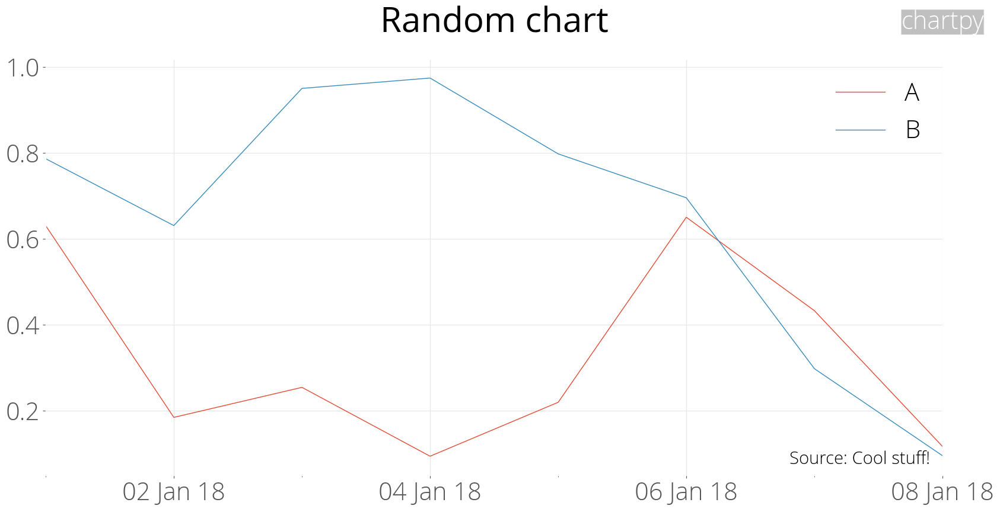

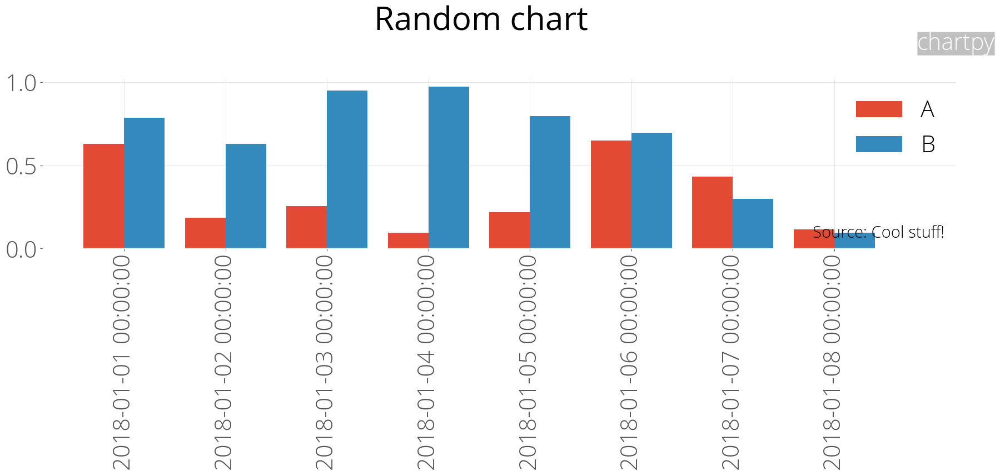

In [108]:
from chartpy import Chart, Style

df_chartpy = pd.DataFrame(index=pd.date_range(start='1/1/2018', periods=8), 
                          data=np.random.rand(8,2), columns=['A', 'B'])

# note that chartpy has its own different styling for Matplotlib charts
style = Style(bokeh_plot_mode="offline_jupyter", plotly_plot_mode='offline_jupyter', 
              title='Random chart', 
              width=600, height=300, source='Cool stuff!')
Chart(engine='matplotlib').plot(df_chartpy, style=style);

style.chart_type = 'bar'
Chart(engine='matplotlib').plot(df_chartpy, style=style);

Let's try doing the same chart in Plotly.. just needs one keyword change! Also let's change the size too.

In [109]:
style.width=200; style.height=100;
fig = Chart(engine='plotly').plot(df_chartpy, style=style)

style.chart_type = 'line'
fig = Chart(engine='plotly').plot(df_chartpy, style=style)

We can also do the same thing in Bokeh too!

In [110]:
fig = Chart(engine='bokeh').plot(df_chartpy, style=style)

Loading BokehJS ...

c:\Anaconda3\py38class\lib\site-packages\bokeh\models\plots.py:815: UserWarning:


You are attempting to set `plot.legend.location` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


c:\Anaconda3\py38class\lib\site-packages\bokeh\models\plots.py:815: UserWarning:


You are attempting to set `plot.legend.label_text_font_size` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


c:\Anaconda3\py38class\lib\site-packages\bokeh\models\plots.py:815: UserWarning:


You are attempting to set `plot.legend.label_text_font` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


c:\Anaconda3

And also we can change the chart type to bar with Bokeh too.

In [111]:
fig = Chart(engine='bokeh').plot(df_chartpy, style=style, chart_type='bar')

Loading BokehJS ...

## Statistical analysis/machine learning

In this section, we'll very briefly discuss Statsmodels. Later, we'lll go into a bit more detail into Scikit-learn, with quite a few different examples.

### Statsmodels

Statmodels is a Python library which has a lot of statistical functions in it, like linear regression and logistic regression (we'll explain that shortly in the Scikit-learn section). It can deal with 'tidy' like data. We can also feed it NumPy arrays too. In the below example, we create a random NumPy array to generate our $X$ independent variables from which we artificially generate a $y$ dependent variable. We then fit a linear regression using Statsmodels.

In [112]:
import numpy as np

import statsmodels.api as sm

# Generate artificial data (2 regressors + constant)
nobs = 1000

X = np.random.random((nobs, 2))
X = sm.add_constant(X)

beta = [1, .1, .5]

e = np.random.random(nobs)

# Artifically generate a Y variable!
y = np.dot(X, beta) + e

# Fit regression model
results = sm.OLS(y, X).fit()

# Inspect the results, like R-squared
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.223
Model:                            OLS   Adj. R-squared:                  0.222
Method:                 Least Squares   F-statistic:                     143.1
Date:                Thu, 03 Feb 2022   Prob (F-statistic):           2.23e-55
Time:                        10:23:10   Log-Likelihood:                -165.85
No. Observations:                1000   AIC:                             337.7
Df Residuals:                     997   BIC:                             352.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.5244      0.023     65.982      0.0

### scikit-learn

scikit-learn is a machine learning for Python (see https://scikit-learn.org/). It can be used to do a number of tasks, and we give a summary of some of them below.

* Classification
    * Identifying to which category an object belongs to.
    * Applications: Spam detection, Image recognition
    * Algorithms: SVM, nearest neighbors, random forest..

* Regression
    * Predicting a continuous-valued attribute associated with an object.
    * Applications: Drug response, Stock prices
    * Algorithms: SVR, ridge regression, Lasso..

* Clustering
    * Automatic grouping of similar objects into sets.
    * Applications: Customer segmentation, Grouping experiment outcomes
    * Algorithms: k-Means, spectral clustering, mean-shift..

* Dimensionality reduction
    * Reducing the number of random variables to consider.
    * Applications: Visualization, Increased efficiency
    * Algorithms: PCA, feature selection, non-negative matrix factorization.

* Model selection
    * Comparing, validating and choosing parameters and models.
    * Goal: Improved accuracy via parameter tuning
    * Modules: grid search, cross validation, metrics.

* Preprocessing
    * Feature extraction and normalization.
    * Application: Transforming input data such as text for use with machine learning algorithms.
    * Modules: preprocessing, feature extraction.

#### What is machine learning?

All of machine learning can be split into one of three groups: supervised learning, unsupervised learning, reinforcement learning. In all types of machine learning, however, we are trying to maximise some score function (or minimise some loss function), whether this be a likelihood (from classical statistics) or some other objective function.

#### Supervised learning

In supervised learning, for each data point, we have a vector of input variables, $x$, and a vector of output variables, $y$, creating a set of $(x,y)$ pairs. The aim is to try to predict $y$ using $x$. 

Within this predictive branch of supervised learning, there are two streams: regression or classification. 

##### Regression

Regression consists of trying to predict a continuous variable, e.g. $y∈(-\infty,\infty$). An example might be predicting a stock’s returns using the current interest rate, $x_1$, and a momentum indicator for the stock, $x_2$.

##### Classification

For classification, we predict which group something belongs in, e.g. $y∈{0,1}$. An example might be trying to predict whether a mortgage will default (belongs to class $1$) given the recipient’s credit score, $x_1$, and the current mortgage interest rate, $x_2$. 

Classification problems are then further subdivided into two categories, generative and discriminative. Generative algorithms provide us with probabilities that the inputs belong to each class, e.g. 

$$P(\text{mortgage will default}│\text{credit score of 700 and interest rate of 4%})=0.1$$

We must then decide how to use these probabilities to assign classes. Discriminative algorithms merely assign a class to each of the input vectors. 


#### Unsupervised learning

Rather than trying to predict the data, unsupervised learning is about understanding and augmenting the data. Here, instead of having $(x,y)$ pairs, we simply have $x$ vectors, i.e. there is nothing to predict. Outputs of unsupervised learning can often be good inputs to supervised learning models. Among the many subfields of unsupervised learning, the most popular are probably clustering and dimensionality reduction. 

##### Clustering

Clustering is about grouping data points, but without prior knowledge of what those groups might be, whereas dimensionality reduction is about expressing the data using less dimensions.

A common example of clustering is in assigning stocks to sectors. This is particularly useful for diversification as it may not be particularly obvious at first that a stock should belong to a sector. By understanding how the elements of our universe form groups (ie. sectors) we can ensure we don’t give any one group too much weight within our portfolio.


#### Reinforcement learning

For reinforcement learning, rather than map an input vector, $x$, to a known output vector that denotes some variable, $y$, either continuous or categorical, we instead want to map an input vector to an action. This is done without prior knowledge of which input vectors we want to map to which actions. These actions then lead to some reward, either immediately or later down the line, decided by some rule set or “environment”. 

If supervised learning is deciding which stocks will experience positive returns (which we would then decide to buy), then reinforcement learning is about teaching the model which stocks to buy (without explicitly stating so) by allowing it to learn that buying stocks that experience positive returns is a good thing. One way to do this is perhaps by giving it a “reward” proportional to end of day CAR. Reinforcement learning, therefore, could be useful to derive trading strategies themselves, rather than us building the strategies around fixed rules where the inputs to those strategies come from models.

The problem with reinforcement learning is that, because our model starts off as being “dumb” and we often have many choices we could make at any point in time, it requires a very large amount of data to train, likely more than currently exists for any financial market. One way to overcome this is if we could set up a way to artificially generate real enough financial market simulations to allow the model to learn what to do in certain situations, much like how we can simulate games of chess or Go. Doing this, however, is not so simple. Reinforcement learning looks like it could be extremely powerful when applied to finance, however, at current, we do not have the means to do so well.

#### Stationarity

This is a very tricky phenomenon and in most cases machine learning models cannot cope with it. In fact, learning always assumes that the underlying probability distribution of the data from which inference is made stays the same. This is a condition hardly encountered in practice. We note that stationarity does not ensure good (or any) predictive power as it is a necessary but non-sufficient condition for the high performance of an algorithm. If we take the examples where deep learning has been particularly successful, it has typically been where the characteristics of the underlying dataset are relatively static, such as identifying cats in photos. Cats do not change over time!


The change in the distribution of data contained in development/test datasets versus the data in the real world on which a model is subsequently applied is called dataset shift (or drifting). Dataset shift could be divided into three types 

* shift in the independent variables (covariate shift) 
* shift in the target variable (prior probability shift) 
* shift in the relationship between the independent and the target variable (concept shift).

#### Financial time series are non-stationary

Financial time series exhibit non-stationarity, such that properties like their 

* mean and variance can change significantly
* underlying probability distribution can change totally

This can be particularly observed during periods of market turbulence, where there are structural breaks in volatility. These can be especially brutal for, say, managed currencies, which volatility is kept artificially low through central bank intervention, and then explodes when central banks are no longer have sufficient funds to keep the currency within a tight bound.


#### Bias, variance and noise

##### Bias

This error is caused by unrealistic and simplifying assumptions. When bias is high, this means that the algorithm has failed to recognize important relations between features and outcomes. 

An example of this is trying a linear fit on data whose data generating process is non-linear e.g. quadratic. In this case, the algorithm is said to be “underfit”.

##### Variance

This error is caused by the sensitivity of the model predictions to small changes in the training set. When the variance is high this means that the algorithm has overfit the training set. Therefore, even miniscule changes in the training set can produce wildly different predictions. For example, fitting a 4-degree polynomial to data generated by a quadratic data generating process. Ultimately, rather than modelling the general patterns in the training set, the algorithm has mistaken the noise with signal. Hence, it was fit to the noise, rather than the underlying signal. 

##### Noise

This error is caused by the variance of the observed values, like changes to external variables to the dataset or measurement errors. This error is irreducible and cannot be explained by any model.

##### Variance-Bias tradeoff

Typically, the bias decreases as model complexity increases. 

The variance, on the other hand, increases as the complexity increases. If we assume that the data we are modelling is stationary over the training and test periods, then our aim will be to minimize the error of a fit e.g. when trying to forecast asset returns.

We illustrate these point below (via https://towardsdatascience.com/understanding-the-bias-variance-tradeoff-165e6942b229), about the balance between overfitting and underfitting.

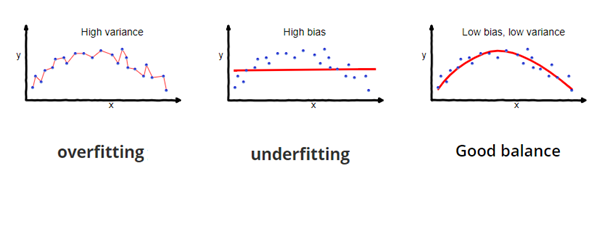

#### Linear regression

This is probably one of the simplest models which make up the area machine learning.

$$y = \beta_0 + \sum_{i=1}^{n}\beta_ix_i + \epsilon$$

In an ordinary least squares linear regression, we are seeking to minimize the sum of the squared errors:

$$\sum_{i=1}^{n}\epsilon^2_i$$

Other than linearity we are making several other assumptions:
* the errors, $\epsilon$, are;
	* normally distributed with mean zero; and
	* homoscedastic (all having the same variance);
* there is no (or suitably small) multicollinearity between the $x_i$ (ie. the variables aren't correlated with one another); and
* errors have no auto-correlation - knowledge of the previous error should not give any information about the next error.

Rather than minimizing the sum of the squared errors, ridge regression instead minimizes a penalised version of the least-squared function. In the below example, we show the differences between a OLS and ridge. Our small dataset only contains 2 points. We try fitting a line of "best fit" with both OLS and ridge. We find that the OLS seems to fit both points very well. However, when we simulate noise (by peturbing the red points), it can change the line of the best fit for OLS substanially.  By contrast ridge regression isn't impacted much by the outliers.

See https://scikit-learn.org/stable/auto_examples/linear_model/plot_ols_ridge_variance.html for more details about this example.

As a first step let's do all the imports and also give our training set.

In [113]:
# Code source: Gaël Varoquaux
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause
import matplotlib as mpl

import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn') # to make the plot style nicer!

from sklearn import linear_model

# Our very small training set (and test)!
X_train = np.c_[.5, 1].T
y_train = [.5, 1]
X_test = np.c_[0, 2].T

# Use the same random seed, so output doesn't change much
np.random.seed(0)

# Try playing around with the shrinkage factor to see how it changes regressions
alpha_ridge = 0.1

classifiers = dict(ols=linear_model.LinearRegression(),
                   ridge=linear_model.Ridge(alpha=alpha_ridge))

plot_trials = True

Now, we shall fit an OLS and ridge model. We show how adding a small amount of noise for the points results can change the line of best fit a lot for OLS. For ridge however it doesn't make much difference and the slope seems much more stable.

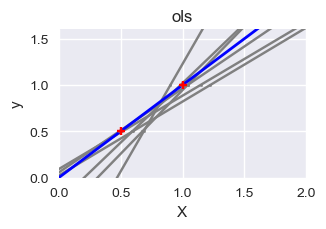

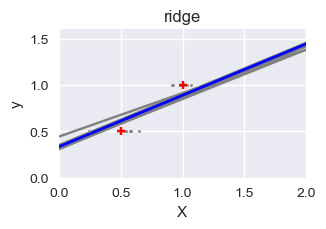

In [114]:
for name, clf in classifiers.items():
    fig, ax = plt.subplots(figsize=(4, 3))
    
    if plot_trials:
        for _ in range(6):
            # Peturb the X values slightly (can think of this like noise) and retrain the model
            this_X = .1 * np.random.normal(size=(2, 1)) + X_train
            clf.fit(this_X, y_train)

            # Now retrain the model, and see how it changes the line of "best fit" in grey
            ax.plot(X_test, clf.predict(X_test), color='gray')
            ax.scatter(this_X, y_train, s=3, c='gray', marker='o', zorder=10)
    
    # Fit the initial model
    clf.fit(X_train, y_train)
    
    # Drop a red line of "best fit" according to the fitted model 
    # to compare with the perturbed 
    ax.plot(X_test, clf.predict(X_test), linewidth=2, color='blue')
    ax.scatter(X_train, y_train, s=30, c='red', marker='+', zorder=10)

    ax.set_title(name)
    ax.set_xlim(0, 2)
    ax.set_ylim((0, 1.6))
    ax.set_xlabel('X')
    ax.set_ylabel('y')

    fig.tight_layout()

plt.show()

#### Logistic regression

Logistic regression is one of the simplest classification algorithms. 

Like linear regression, logistic regression takes a set of inputs and combines them in a linear fashion to get an output value. If this output value is above some threshold, we classify those inputs as group $1$ and otherwise as group $0$. As doing things on a linear scale is slightly confusing, logistic regression converts this linear value to a probability through the use of the logistic function, 

$$f(x)=\frac{1}{1+e^{-x}}=\frac{e^x}{1+e^x}$$

Putting this all together, we calculate the probability that the inputs belong to group $1$ by calculating:

$$p=f\left(\beta_0 + \sum_{i=1}^{n}\beta_ix_i\right)$$

We classify the inputs to group $1$ if $p>0.5$ and to group $0$ otherwise. Similar to linear regression, logistic regression assumes that there is little to no multicollinearity between the $x_i$. However, as we apply a nonlinear transformation here, instead of requiring a linear relationship between the $x_i$ and $y$, we instead require a linear relationship between the $x_i$ and $log⁡(\frac{p}{1-p})$, the log-odds. 

Logistic regression could be used in a variety of situations within finance. The only strict constraint is that an increase in each of your features should always lead to an increase/decrease in the probability of belonging to a class (i.e. increase always causes increase or increase always causes decrease). Like linear regression and regression, logistic regression is likely the first model you should attempt when trying to classify something based on just a few inputs (i.e. not performing something like image classification).

##### Logistic regression example

In the below example, we use logistic regression to cluster together flowers according to their sepal length and width. Earlie, we saw a similar dataset being plotted in our section on Plotly Express. We use a a multinomial classifier (ie. have more than 2 possible classifications). 

Note that in this case, it is relatively easy to separate the various clusters using straight lines (even if it isn't a "perfect" fit). In practice, many clusters for other problems might not be separable using a linear function like this.

As a first step we do all our imports and also load up the dataset, which is a standard one from the scikit-learn library.

In [115]:
# Modied from code source by Gaël Varoquaux
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.style.use('seaborn') # to make the plot style nicer!

from sklearn.linear_model import LogisticRegression
from sklearn import datasets

# Import some data to play with
iris = datasets.load_iris()
X = iris.data[:, :2]  # we only take the first two features.
Y = iris.target

Let's print the input data (X).

In [116]:
print(X[0:10])

[[5.1 3.5]
 [4.9 3. ]
 [4.7 3.2]
 [4.6 3.1]
 [5.  3.6]
 [5.4 3.9]
 [4.6 3.4]
 [5.  3.4]
 [4.4 2.9]
 [4.9 3.1]]


Let's print the output data too (Y).

In [117]:
print(Y[0:200])

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2]


Let's now create the logistic regression model and fit the coefficients, specifying we want a multinomial model (ie. classification has more than two possibilities).

In [118]:
logreg = LogisticRegression(C=1e5, solver='lbfgs', multi_class='multinomial')

# Create an instance of Logistic Regression Classifier and fit the data.
logreg.fit(X, Y)

LogisticRegression(C=100000.0, multi_class='multinomial')

The next step is to create the meshgrid of our decision boundary. We then use the cofficients of the fitted logistic regression model.

In [119]:
# Plot the decision boundary. For that, we will assign a color to each
# point in the mesh [x_min, x_max]x[y_min, y_max].
x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = logreg.predict(np.c_[xx.ravel(), yy.ravel()])

Finally let us plot the results of our classification using matplotlib. We have shaded the three different areas.

C:\Users\saeed\DOCUME~1\MobaXterm\slash\var\log\xwin/ipykernel_34388/1337592692.py:4: MatplotlibDeprecationWarning:

shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.



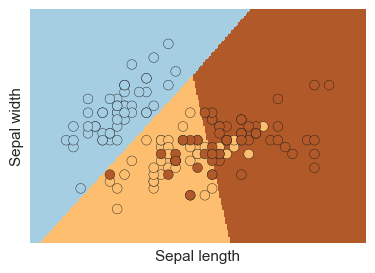

In [120]:
# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1, figsize=(4, 3))
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Paired)

# Plot also the training points
plt.scatter(X[:, 0], X[:, 1], c=Y, edgecolors='k', cmap=plt.cm.Paired)
plt.xlabel('Sepal length')
plt.ylabel('Sepal width')

plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.xticks(())
plt.yticks(())

plt.show()

#### Classifying handwritten digits with support vector classifier

In this example, taken from scikit-learn, a support vector classifier is used to identify handwriting datasets. We use scikit-learn's "digit" dataset, which has 1797 8x8 images of handwriting digits. We use half the dataset to train the model. As a first step let's import the various scikit-learn modules we'll need, and we can also plot a few of the training set examples, which have been labelled for us (hence this is a supervised learning problem).

In [121]:
# Author: Gael Varoquaux <gael dot varoquaux at normalesup dot org>
# License: BSD 3 clause

# Standard scientific Python imports
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.style.use('seaborn') # to make the plot style nicer!

# Import datasets, classifiers and performance metrics
from sklearn import datasets, svm, metrics

# The digits dataset
digits = datasets.load_digits()

Let's plot a few images and also print the underlying matrices which represent those images.

-----
0
[[ 0.  0.  5. 13.  9.  1.  0.  0.]
 [ 0.  0. 13. 15. 10. 15.  5.  0.]
 [ 0.  3. 15.  2.  0. 11.  8.  0.]
 [ 0.  4. 12.  0.  0.  8.  8.  0.]
 [ 0.  5.  8.  0.  0.  9.  8.  0.]
 [ 0.  4. 11.  0.  1. 12.  7.  0.]
 [ 0.  2. 14.  5. 10. 12.  0.  0.]
 [ 0.  0.  6. 13. 10.  0.  0.  0.]]
-----
1
[[ 0.  0.  0. 12. 13.  5.  0.  0.]
 [ 0.  0.  0. 11. 16.  9.  0.  0.]
 [ 0.  0.  3. 15. 16.  6.  0.  0.]
 [ 0.  7. 15. 16. 16.  2.  0.  0.]
 [ 0.  0.  1. 16. 16.  3.  0.  0.]
 [ 0.  0.  1. 16. 16.  6.  0.  0.]
 [ 0.  0.  1. 16. 16.  6.  0.  0.]
 [ 0.  0.  0. 11. 16. 10.  0.  0.]]
-----
2
[[ 0.  0.  0.  4. 15. 12.  0.  0.]
 [ 0.  0.  3. 16. 15. 14.  0.  0.]
 [ 0.  0.  8. 13.  8. 16.  0.  0.]
 [ 0.  0.  1.  6. 15. 11.  0.  0.]
 [ 0.  1.  8. 13. 15.  1.  0.  0.]
 [ 0.  9. 16. 16.  5.  0.  0.  0.]
 [ 0.  3. 13. 16. 16. 11.  5.  0.]
 [ 0.  0.  0.  3. 11. 16.  9.  0.]]
-----
3
[[ 0.  0.  7. 15. 13.  1.  0.  0.]
 [ 0.  8. 13.  6. 15.  4.  0.  0.]
 [ 0.  2.  1. 13. 13.  0.  0.  0.]
 [ 0.  0.  2. 15. 11

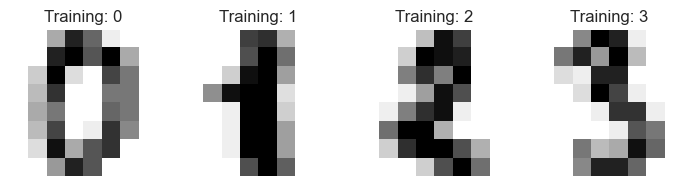

In [122]:
# The data that we are interested in is made of 8x8 images of digits, let's
# have a look at the first 4 images, stored in the `images` attribute of the
# dataset.  If we were working from image files, we could load them using
# matplotlib.pyplot.imread.  Note that each image must have the same size. For these
# images, we know which digit they represent: it is given in the 'target' of
# the dataset.
images_and_labels = list(zip(digits.images, digits.target))
for index, (image, label) in enumerate(images_and_labels[:4]):
    plt.subplot(2, 4, index + 1)
    plt.axis('off')
    plt.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    plt.title('Training: %i' % label)
    
    print("-----")
    print(label)
    print(image)

To use the classifier on this data, we need to flatten the image, to turn the data from (samples, feature) matrix (ie. in this case, we go from an 8x8 image and a matrix of entries) to a vector of length 64, which can be more easily number crunched.

In [123]:
n_samples = len(digits.images)
data = digits.images.reshape((n_samples, -1))

We use a support vector classifier to fit our training data. In a sense a SVM (support vector machine) is like a logistic regression, but it can handle non-linear relationships better than logistic regressions. SVM have a "kernel trick" that transforms points into a higher dimensional space to make separation of the clusters easier. In the below example, it looks like it is impossible to separate the points using a straight line...

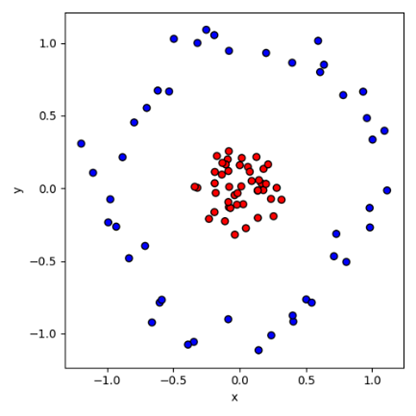

But we can increase the dimension doing the "kernel trick" from 2D into 3D space. Now we can linearly separate the clusters.

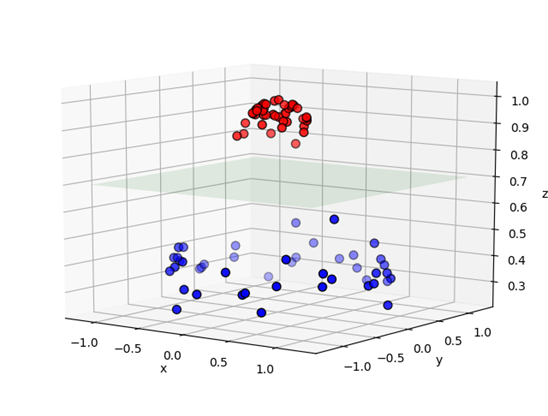

In our case, we want the classifier can learn the mapping between the images of digits $X$ and the actual digit $Y$.

In [124]:
# Create a classifier: a support vector classifier
classifier = svm.SVC(gamma=0.001)

# We learn the digits on the first half of the digits
classifier.fit(data[:n_samples // 2], digits.target[:n_samples // 2]);

We then use the 2nd half of the dataset to "test" our model which has been fitted on the training set (the 1st half). We'll plot a few of the test images, alongside the model predictions of the digits.

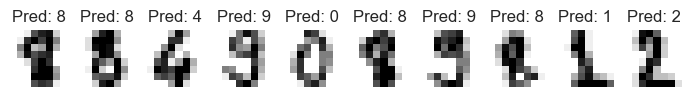

In [125]:
import matplotlib as mpl
mpl.style.use('seaborn') # to make the plot style nicer!

# Grab the expected values, vs the predictions
expected = digits.target[n_samples // 2:]
predicted = classifier.predict(data[n_samples // 2:])

# List of the images and the predicted digit value
images_and_predictions = list(zip(digits.images[n_samples // 2:], predicted))

number_of_predictions_to_plot = 10

for index, (image, prediction) in enumerate(images_and_predictions[:number_of_predictions_to_plot]):
    plt.subplot(3, number_of_predictions_to_plot, index + number_of_predictions_to_plot + 1)
    plt.axis('off')
    plt.imshow(image, cmap=plt.cm.gray_r, interpolation='nearest')
    plt.title('Pred: %i' % prediction)

plt.show()

Rather than plotting individual examples, we can report how good the predictions on the whole test set with a classifcation report. The confusion matrix, gives us an indication of any false positives (actual values are along the y-axis whereas, the predictions are along the x-axis). For example for the number 9, in 90 cases, the actual and predicted were the same. There were 4 cases, where the prediction was for a handwritten 9, but 4 was actually written.

In [126]:
classification_recall = metrics.classification_report(expected, predicted)
confusion_matrix = metrics.confusion_matrix(expected, predicted)

print("Classification report for classifier %s:\n%s\n"
      % (classifier, classification_recall))
print("Confusion matrix (actual value on y-axis, predictions on x-axis):\n%s" 
      % confusion_matrix)

Classification report for classifier SVC(gamma=0.001):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        88
           1       0.99      0.97      0.98        91
           2       0.99      0.99      0.99        86
           3       0.98      0.87      0.92        91
           4       0.99      0.96      0.97        92
           5       0.95      0.97      0.96        91
           6       0.99      0.99      0.99        91
           7       0.96      0.99      0.97        89
           8       0.94      1.00      0.97        88
           9       0.93      0.98      0.95        92

    accuracy                           0.97       899
   macro avg       0.97      0.97      0.97       899
weighted avg       0.97      0.97      0.97       899


Confusion matrix (actual value on y-axis, predictions on x-axis):
[[87  0  0  0  1  0  0  0  0  0]
 [ 0 88  1  0  0  0  0  0  1  1]
 [ 0  0 85  1  0  0  0  0  0  0]
 [ 0  0  0 79  0  3 

We can also view the confusion matrix with Seaborn.

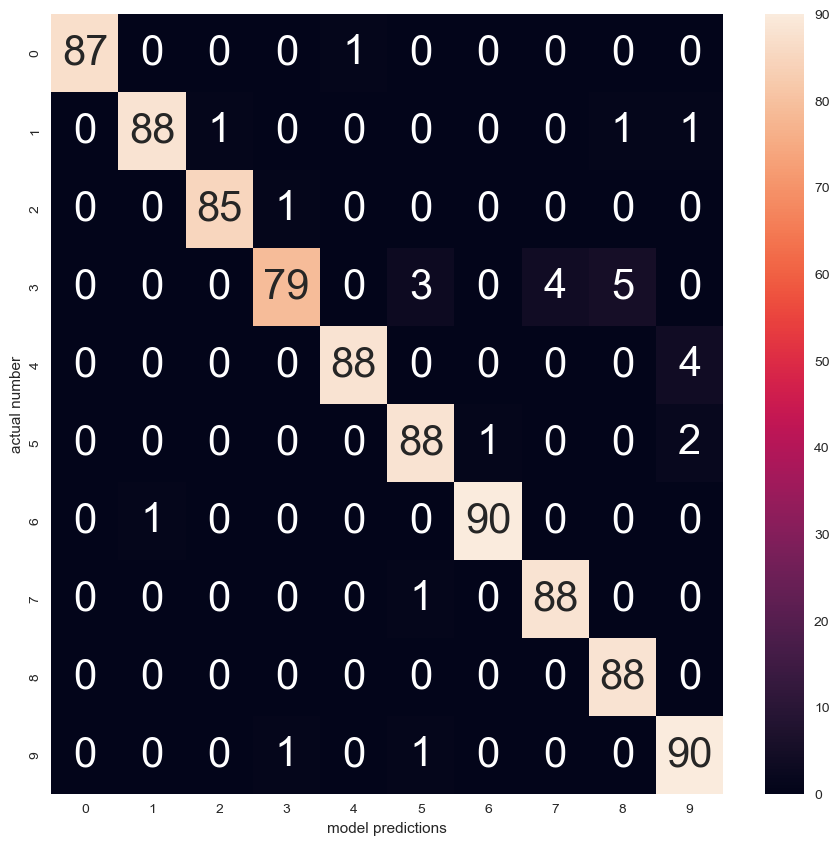

In [127]:
import seaborn as sn
import pandas as pd

indices = [i for i in range(0,10)]

df_cm = pd.DataFrame(confusion_matrix, index=indices, columns=indices)
plt.figure(figsize=(10,10))
ax = sn.heatmap(df_cm, annot=True)
ax.set(xlabel='model predictions', ylabel='actual number')
sn.set(font_scale=1.4)

plt.show()

#### How are currency pairs related to one another over time?

One way to understand the relationships between assets is to calculate the returns, and then run the correlation between pairs of assets. We can build up a correlation matrix that will contain all the pairwise correlations (or covariance matrix), which we'll show.

We can use scikit-learn to understand how variables are related to each other using more advanced techniques, which can create a graph showing dependence relationships. At https://scikit-learn.org/stable/auto_examples/applications/plot_stock_market.html there is an example which shows how stocks cluster together. We use a technique called graphical lasso (which amounts to finding the inverse of the covariance matrix).

We shall adapt that example to examine how currency markets are related together over different years. We need to first import the API key to use Quandl. You'll need to change this your own API key. You can create a free API key for Quandl data on their website. Further details are at https://docs.quandl.com/docs#section-authentication

In [128]:
# Either set API keys as an environment variable (preferred for security reasons) 
# or easier to just replace these below, with your own keys (if you aren't sharing your notebooks)
try:
    import os
    
    QUANDL_API_KEY = os.environ['QUANDL_API_KEY']
except:
    pass

The first step we need is to get the market data for FX. We'll use Pandas and NumPy here. We'll also be using a package findatapy and the data provided Quandl to source the data (we'll be discussing all this in the next notebook). Essentially, we'll end up with a `DataFrame` of historical returns as a result. The original example looks at stocks, but we have compared it to look at USD crosses in FX.

Let's first import all the packages we'll need for this task.

In [129]:
# Modified from author: Gael Varoquaux gael.varoquaux@normalesup.org
# https://scikit-learn.org/stable/auto_examples/applications/plot_stock_market.html
# License: BSD 3 clause

import sys

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

import pandas as pd

from sklearn import cluster, covariance, manifold

print(__doc__)

# year = 2018

Automatically created module for IPython interactive environment


Now we can define all the tickers we need. Quandl, our external data provider, has unique tickers for each time series they host. We have also provided our own shorthand names which are easier to understand.

In [130]:
# Define the tickers for Quandl and our shorthand names
# This is in the quotation conventon

symbol_dict = {
    # G10 FX
    'FRED/DEXUSEU' :  'EURUSD',
    'FRED/DEXJPUS' :  'USDJPY',
    'FRED/DEXUSUK' :  'GBPUSD',
    'FRED/DEXUSAL' :  'AUDUSD',
    'FRED/DEXCAUS' :  'USDCAD',
    'FRED/DEXUSNZ' :  'NZDUSD',
    'FRED/DEXSZUS' :  'USDCHF',
    'FRED/DEXNOUS' :  'USDNOK',
    'FRED/DEXSDUS' :  'USDSEK',
    
    # EM FX
    'FRED/DEXCHUS' :  'USDCNY',
    'FRED/DEXKOUS' :  'USDKRW',
    'FRED/DEXINUS' :  'USDINR',
    'FRED/DEXBZUS' :  'USDBRL',
    'FRED/DEXMXUS' :  'USDMXN',
    'FRED/DEXSFUS' :  'USDZAR'
}

The next step is to download the data from Quandl. We'll use a library called findatapy (note: it is possible to use the Quandl library to download this data too, but the syntax is different - see https://www.quandl.com/tools/python for more details). We specify properties such as the start date, the Quandl vendor ticker names, our shortcut names etc. This will give us a lot of diagnostic output, to show us how the download process is going. We will start from 1999, because that is the start date of the EUR.

In [131]:
# Get the tickers/symbols and our shorthand names
symbols, names = np.array(sorted(symbol_dict.items())).T

from findatapy.market import Market, MarketDataGenerator, MarketDataRequest

market = Market(market_data_generator=MarketDataGenerator())

md_request = MarketDataRequest(start_date='01 Jan 1999',
                      finish_date='01 Aug 2019',
                      tickers=names.tolist(),
                      vendor_tickers=symbols.tolist(),
                      data_source='quandl',
                      quandl_api_key=QUANDL_API_KEY)

# Get market data (and fill down blanks - note filling down blanks is a simplification)
# We cannot trade in practice on market holidays
df_market = market.fetch_market(md_request=md_request).fillna(method='ffill')

c:\Anaconda3\py38class\lib\site-packages\arctic\_util.py:6: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



2022-02-03 10:23:17,260 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:17,260 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:17,265 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:17,266 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:20,698 - findatapy.market.datavendorweb - INFO - Completed request from Quandl for ['USDMXN.close', 'USDNOK.close']
2022-02-03 10:23:21,681 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:23,538 - findatapy.market.datavendorweb - INFO - Completed request from Quandl for ['USDBRL.close', 'USDCAD.close']
2022-02-03 10:23:23,554 - findatapy.market.datavendorweb - INFO - Completed request from Quandl for ['USDJPY.close', 'USDKRW.close']
2022-02-03 10:23:23,701 - findatapy.market.datavendorweb - INFO - Request Quandl data
2022-02-03 10:23:23,735 - findatapy.market.datavendorweb - INFO - Completed request f

We could also download the same data using the Quandl Python library. We need to set the Quandl API key.

In [132]:
import quandl
quandl.ApiConfig.api_key = QUANDL_API_KEY

df_market_quandl = pd.DataFrame(quandl.get(symbols.tolist(), start_date="1999-01-01", end_date="2019-08-01"))

df_market_quandl.columns = [x + '.close' for x in names.tolist()]

Let's have a look at the data downloaded via findatapy and Quandl's API (note: at this stage we haven't flipped any crosses which are quoted as USD terms). It is the same (except for rounding).

In [133]:
df_market.head(5)

,USDBRL.close,USDCAD.close,USDCNY.close,USDINR.close,USDJPY.close,USDKRW.close,USDMXN.close,USDNOK.close,USDSEK.close,USDZAR.close,USDCHF.close,AUDUSD.close,EURUSD.close,NZDUSD.close,GBPUSD.close
Date,,,,,,,,,,,,,,,
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.8950,NaN,NaN,NaN,NaN,NaN
1999-01-04,1.2074,1.5268,8.2793,42.599998,112.150002,1187.5,9.831,7.4960,8.020,5.8675,1.3666,0.6182,1.1812,0.5340,1.6581
1999-01-05,1.2075,1.5213,8.2795,42.560001,111.150002,1166.0,9.796,7.4340,7.972,5.7625,1.3694,0.6217,1.1760,0.5370,1.6566
1999-01-06,1.2110,1.5110,8.2795,42.549999,112.779999,1160.0,9.780,7.4355,7.936,5.6775,1.3852,0.6285,1.1636,0.5385,1.6547
1999-01-07,1.2100,1.5117,8.2798,42.549999,111.690002,1151.0,9.830,7.4050,7.915,5.8400,1.3863,0.6340,1.1672,0.5405,1.6495


In [134]:
df_market_quandl.head(5)

,USDBRL.close,USDCAD.close,USDCNY.close,USDINR.close,USDJPY.close,USDKRW.close,USDMXN.close,USDNOK.close,USDSEK.close,USDZAR.close,USDCHF.close,AUDUSD.close,EURUSD.close,NZDUSD.close,GBPUSD.close
Date,,,,,,,,,,,,,,,
1999-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.8950,NaN,NaN,NaN,NaN,NaN
1999-01-04,1.2074,1.5268,8.2793,42.60,112.15,1187.5,9.831,7.4960,8.020,5.8675,1.3666,0.6182,1.1812,0.5340,1.6581
1999-01-05,1.2075,1.5213,8.2795,42.56,111.15,1166.0,9.796,7.4340,7.972,5.7625,1.3694,0.6217,1.1760,0.5370,1.6566
1999-01-06,1.2110,1.5110,8.2795,42.55,112.78,1160.0,9.780,7.4355,7.936,5.6775,1.3852,0.6285,1.1636,0.5385,1.6547
1999-01-07,1.2100,1.5117,8.2798,42.55,111.69,1151.0,9.830,7.4050,7.915,5.8400,1.3863,0.6340,1.1672,0.5405,1.6495


Now, we need to resample the data into weekly points. This will be less noisy. Also spot data will be less impacted by the fact that closing times can be different for certain emerging markets.

In [135]:
# resample into weekly data (to take into account different closes)
df_market_resampled = df_market.resample('W').last()

Now, convert every cross into USD as the base currency, to make comparison easier. For EURUSD, EUR is the base/foreign currency and USD is the terms/domestic currency. If we want to think of stocks, we can imagine that the number of shares is the 'base' currency, and the value of each share in USD is the 'terms', eg Apple/USD (although no one would say this in practice).

In [136]:
# for crosses quoted xxxUSD, make USD base currency by inverting spot rate
for c in df_market_resampled.columns:
    if 'USD' == c[3:6]:
        print("Flipping " + c)
        df_market_resampled[c] = 1.0 / df_market_resampled[c]

# change the ticker names to make everything USDxxx
df_market_resampled.columns  = [c if 'USD' == c[0:3] else c[3:6] + c[0:3] + ".close" 
                      for c in df_market_resampled.columns ]
names = np.array([str(c).split('.close')[0] for c in df_market_resampled.columns])

# calculate returns (first day has return is undefined)
df_returns = df_market_resampled / df_market_resampled.shift(1) - 1
df_returns.columns = names
# df_returns = df_market[1:]

Flipping AUDUSD.close
Flipping EURUSD.close
Flipping NZDUSD.close
Flipping GBPUSD.close


Let's have a look at the resampled spot prices.

In [137]:
df_market_resampled.head(5)

,USDBRL.close,USDCAD.close,USDCNY.close,USDINR.close,USDJPY.close,USDKRW.close,USDMXN.close,USDNOK.close,USDSEK.close,USDZAR.close,USDCHF.close,USDAUD.close,USDEUR.close,USDNZD.close,USDGBP.close
Date,,,,,,,,,,,,,,,
1999-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.895,NaN,NaN,NaN,NaN,NaN
1999-01-10,1.2095,1.5145,8.2796,42.549999,111.519997,1174.0,9.8105,7.397,7.9285,5.835,1.3970,1.580778,0.865501,1.851852,0.609570
1999-01-17,1.4800,1.5290,8.2790,42.500000,114.190002,1185.0,10.2900,7.485,7.8740,6.080,1.3785,1.577287,0.862738,1.850139,0.606061
1999-01-24,1.7000,1.5190,8.2787,42.549999,114.650002,1181.0,10.2025,7.465,7.7300,6.045,1.3829,1.575299,0.863409,1.863933,0.603865
1999-01-31,2.0700,1.5095,8.2778,42.540001,116.000000,1176.0,10.1520,7.523,7.7870,6.070,1.4168,1.588058,0.879430,1.856321,0.607644


We can also use the describe function to see what the returns look like in aggregation, as a sanity check for our data. We can see that some weekly returns are huge, eg. more than 10%, but this is conceivable during times of crisis. We now have returns for each currency pair. Obviously, for the first week our returns are undefined. We multiply by 100 for visualisation purposes (ie. 1 = 1% here).

In [138]:
(df_returns * 100).describe()

,USDBRL,USDCAD,USDCNY,USDINR,USDJPY,USDKRW,USDMXN,USDNOK,USDSEK,USDZAR,USDCHF,USDAUD,USDEUR,USDNZD,USDGBP
count,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000,1074.000000,1073.000000,1073.000000,1073.000000,1073.000000,1073.000000
mean,0.137190,-0.005434,-0.016589,0.048960,0.007349,0.009825,0.073505,0.029190,0.030632,0.109607,-0.020064,0.007328,0.012888,-0.002215,0.036387
std,2.469682,1.218424,0.295420,0.883436,1.419609,1.327358,1.498501,1.569619,1.572675,2.277074,1.521084,1.740545,1.331303,1.797312,1.298563
min,-11.100876,-4.530817,-1.998425,-4.921019,-8.639055,-10.714287,-6.501823,-6.782884,-6.129628,-11.141121,-16.382622,-6.221473,-5.206376,-6.440681,-5.238324
25%,-1.143819,-0.730854,-0.075048,-0.312495,-0.815356,-0.691497,-0.728023,-1.065964,-1.008725,-1.314750,-0.939351,-1.026690,-0.864977,-1.118141,-0.801700
50%,-0.061446,-0.039798,-0.001210,0.000000,0.039470,-0.042242,-0.015515,-0.064123,-0.045186,-0.038409,0.000000,-0.119209,-0.035739,-0.185311,-0.011754
75%,1.153684,0.636446,0.016105,0.404739,0.908101,0.626957,0.840497,0.977397,1.013505,1.352015,0.908995,0.854850,0.824821,0.922501,0.790119
max,22.364616,10.032368,2.932978,4.379094,6.088078,8.265055,16.684795,6.604409,7.419288,12.061798,12.439585,18.664814,6.511581,11.174488,10.722292


Let's also check the aggregated stats of the spot data.

In [139]:
df_market_resampled.describe()

,USDBRL.close,USDCAD.close,USDCNY.close,USDINR.close,USDJPY.close,USDKRW.close,USDMXN.close,USDNOK.close,USDSEK.close,USDZAR.close,USDCHF.close,USDAUD.close,USDEUR.close,USDNZD.close,USDGBP.close
count,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000,1075.000000,1074.000000,1074.000000,1074.000000,1074.000000,1074.000000
mean,2.484677,1.240994,7.253303,51.906612,106.919868,1127.617432,12.910917,7.073735,7.885986,9.164778,1.170231,1.340164,0.847561,1.559939,0.636759
std,0.696286,0.187157,0.840487,9.390587,13.214269,102.492271,3.247532,1.187352,1.161609,2.779753,0.255920,0.269246,0.126408,0.340224,0.078723
min,1.209500,0.936000,6.048600,39.110001,75.720001,908.000000,8.980000,5.009300,5.893400,5.615000,0.760000,0.909008,0.629010,1.135847,0.478217
25%,1.877250,1.059825,6.481950,44.785000,100.987503,1070.437500,10.636250,6.014625,6.870300,6.949800,0.968850,1.120480,0.752644,1.326128,0.593868
50%,2.276050,1.245100,6.877150,47.605000,109.275002,1130.344971,12.077200,6.846500,7.798550,8.000000,1.075350,1.315963,0.822876,1.449906,0.631752
75%,3.062950,1.353600,8.276700,61.622501,117.290001,1183.149902,13.795526,8.188450,8.641550,11.107250,1.302150,1.457832,0.910312,1.700753,0.686118
max,4.185200,1.612800,8.280000,73.760002,134.770004,1549.599976,21.891001,9.560000,10.955000,16.812500,1.808500,2.065689,1.193033,2.525253,0.823384


Let's drop the NaN points.

In [140]:
df_returns = df_returns.dropna()

As a first step let's calculate correlation matrix on our weekly returns, which is pretty easy using pandas using the corr function. We plot the results as a heatmap with Seaborn. As we would expect everything seems correlated (after all, we are plotting USD crosses). However, some clearly do exhibit high correlations, eg. USD/AUD vs. USD/NZD. USD/CNY seems to have less correlation in general. Note, if we hadn't "flipped" the currencies where USD is the terms currency, those would "appear" to be all decorrelated!

<AxesSubplot:>

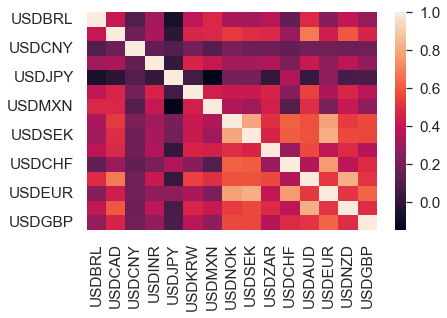

In [141]:
%matplotlib inline

import seaborn as sn

corr = df_returns.corr()

sn.heatmap(corr)

Let's now create a function to actually construct the edge model.

In [142]:
def create_edge_model(df_returns, year):
    df_returns_subset = df_returns[(df_returns.index.year >= year) & (df_returns.index.year <= year)]

    # stack returns on top of each other
    returns = np.vstack([df_returns_subset[n] for n in names])

    # #############################################################################
    # Learn a graphical structure from the correlations

    # Standardize the time series: using correlations rather than covariance
    # is more efficient for structure recovery
    X = returns.copy().T
    X /= X.std(axis=0)
    
    try:
        # For newer versions of scikit-learn
        edge_model = covariance.GraphicalLassoCV(cv=5, tol=0.001)
    except:
        edge_model = covariance.GraphLassoCV(cv=5)
        
    edge_model.fit(X)

    # #############################################################################
    # Cluster using affinity propagation

    _, labels = cluster.affinity_propagation(edge_model.covariance_)
    n_labels = labels.max()

    for i in range(n_labels + 1):
        print('Cluster %i: %s' % ((i + 1), ', '.join(names[labels == i])))

    # #############################################################################
    # Find a low-dimension embedding for visualization: find the best position of
    # the nodes (the assets) on a 2D plane

    # We use a dense eigen_solver to achieve reproducibility (arpack is
    # initiated with random vectors that we don't control). In addition, we
    # use a large number of neighbors to capture the large-scale structure.
    node_position_model = manifold.LocallyLinearEmbedding(
        n_components=2, eigen_solver='dense', n_neighbors=6)

    embedding = node_position_model.fit_transform(X.T).T
    
    return edge_model, embedding, labels

The last step is to create a visualisation for the edge model using Matplotlib.

In [143]:
def create_edge_visualisation(edge_model, embedding, names, labels, title=''):
    # #############################################################################
    # Visualization
    plt.figure(1, facecolor='w', figsize=(5, 5))
    plt.clf()
    ax = plt.axes([0., 0., 1., 1.])
    plt.axis('off')
    plt.title(title)

    # Display a graph of the partial correlations
    partial_correlations = edge_model.precision_.copy()
    d = 1 / np.sqrt(np.diag(partial_correlations))
    partial_correlations *= d
    partial_correlations *= d[:, np.newaxis]
    non_zero = (np.abs(np.triu(partial_correlations, k=1)) > 0.02)

    # Plot the nodes using the coordinates of our embedding
    plt.scatter(embedding[0], embedding[1], s=100 * d ** 2, c=labels,
                cmap=plt.cm.nipy_spectral)

    # Plot the edges
    start_idx, end_idx = np.where(non_zero)
    # a sequence of (*line0*, *line1*, *line2*), where::
    #            linen = (x0, y0), (x1, y1), ... (xm, ym)
    segments = [[embedding[:, start], embedding[:, stop]]
                for start, stop in zip(start_idx, end_idx)]
    values = np.abs(partial_correlations[non_zero])
    lc = LineCollection(segments,
                        zorder=0, cmap=plt.cm.hot_r,
                        norm=plt.Normalize(0, .7 * values.max()))
    lc.set_array(values)
    lc.set_linewidths(15 * values)
    ax.add_collection(lc)

    # Add a label to each node. The challenge here is that we want to
    # position the labels to avoid overlap with other labels
    for index, (name, label, (x, y)) in enumerate(
            zip(names, labels, embedding.T)):

        dx = x - embedding[0]
        dx[index] = 1
        dy = y - embedding[1]
        dy[index] = 1
        this_dx = dx[np.argmin(np.abs(dy))]
        this_dy = dy[np.argmin(np.abs(dx))]
        if this_dx > 0:
            horizontalalignment = 'left'
            x = x + .002
        else:
            horizontalalignment = 'right'
            x = x - .002
        if this_dy > 0:
            verticalalignment = 'bottom'
            y = y + .002
        else:
            verticalalignment = 'top'
            y = y - .002
        plt.text(x, y, name, size=10,
                 horizontalalignment=horizontalalignment,
                 verticalalignment=verticalalignment,
                 bbox=dict(facecolor='w',
                           edgecolor=plt.cm.nipy_spectral(label / float(labels.max())),
                           alpha=.6))

    plt.xlim(embedding[0].min() - .15 * embedding[0].ptp(),
             embedding[0].max() + .10 * embedding[0].ptp(),)
    plt.ylim(embedding[1].min() - .03 * embedding[1].ptp(),
             embedding[1].max() + .03 * embedding[1].ptp())

    plt.show()

Let's run this for a few years to compare between them. We note that in 2008 and 2018 that USDCNY appears to be unrelated to most of the other USD crosses. In 2019, we see that USDCNY appears to be more related to what's going on. The reason is that PBOC policy changed over time with respect to CNY. The changes in trading regimes for CNY (see https://www.imf.org/~/media/Files/Publications/WP/2019/WPIEA2019050.ashx and https://www.frbsf.org/economic-research/files/el2017-28.pdf)
* In September 2005, the trading band for non-U.S. dollar currencies was widened to +/- 3 percent.
* In January 2006, the formation of the daily central RMB/USD parity rate was changed. It was to be calculated as a trimmed weighted average of quotes received from market-making banks before the start of the trading day, with the quotes being based on banks’ views of market supply and demand.
* In May 2007, the daily band around the central RMB/USD parity was widened to +/-0.5 percent. 
* It was widened further to +/-1 percent in April 2012
* And again in +/-2 percent in March 2014

You can play with this, changing the years to see how it changes the network plot. The darker colored edge indicates more dependence (eg. USD/AUD and USD/NZD). We also have other strong relationships that seem to make "sense" like between the scandis (NOK and SEK).

Cluster 1: USDCNY
Cluster 2: USDINR
Cluster 3: USDJPY
Cluster 4: USDNOK, USDSEK, USDCHF, USDEUR
Cluster 5: USDBRL, USDCAD, USDKRW, USDMXN, USDZAR, USDAUD, USDNZD, USDGBP


c:\Anaconda3\py38class\lib\site-packages\numpy\core\_methods.py:202: RuntimeWarning:

invalid value encountered in subtract



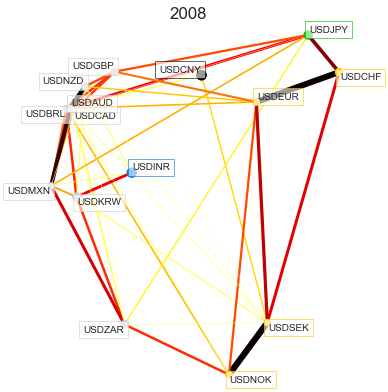

Cluster 1: USDCNY
Cluster 2: USDJPY
Cluster 3: USDNOK, USDSEK, USDCHF, USDEUR, USDGBP
Cluster 4: USDBRL, USDCAD, USDINR, USDKRW, USDMXN, USDZAR, USDAUD, USDNZD


c:\Anaconda3\py38class\lib\site-packages\numpy\core\_methods.py:202: RuntimeWarning:

invalid value encountered in subtract



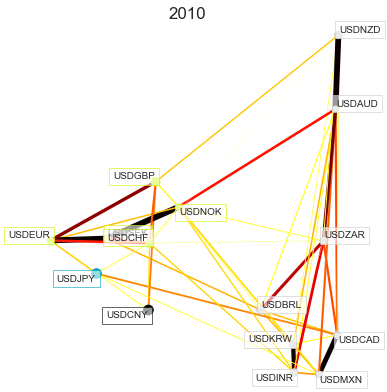

Cluster 1: USDCNY, USDKRW
Cluster 2: USDINR
Cluster 3: USDJPY
Cluster 4: USDMXN
Cluster 5: USDBRL, USDCAD, USDNOK, USDSEK, USDZAR, USDCHF, USDAUD, USDEUR, USDNZD, USDGBP


c:\Anaconda3\py38class\lib\site-packages\numpy\core\_methods.py:202: RuntimeWarning:

invalid value encountered in subtract



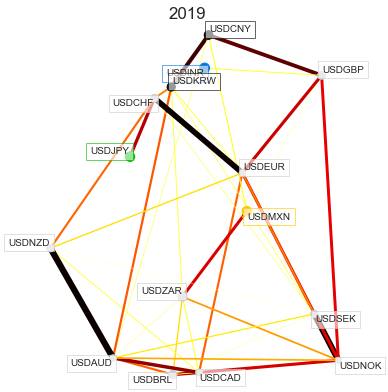

In [144]:
year_list = [2008, 2010, 2019]

for y in year_list:
    edge_model, embedding, labels = create_edge_model(df_returns, y)
    create_edge_visualisation(edge_model, embedding, names, labels, title=y)

## Tutorial

Below we have a few Python code writing exercises to try, using what you have learnt on data analysis with Python.

### Install Anaconda and PyCharm

Before doing this, it's worth trying to install Anaconda and PyCharm on your laptop (see separate notebook with full instructions) and all the other Python libraries you'll need for this Python course. Alternatively, do this for the next class and just use https://repl.it/languages/python3 for this tutorial (visualisations may not work fully though with Repl.it) or using Google Colab.

### NumPy

* Create a large NumPy array (eg. 1 million random floats from uniform distribution)
* Grab the first 100 elements
* Grab the last 100 elements
* Add both of these and print the output
* Create a large randomised matrix (eg. 100 x 100)
* Do basic operations on the matrix, like multiplication and addition and print the output
* Create a matrix of ones and then zeros for a 3 x 2 matrix (ie. 3 rows and 2 columns)
* Add the ones and zeros matices, printing the output

### Pandas

* Create a large Pandas DataFrame of 1 minute data for 5 years with random integers with a uniform distribution between 0 and 100 with 10 columns
* Count the number of each element between 0 and 10 in each column and print
* Redo the exercise with random integers sampled using a normal distribution (note: you'll have to also use rounding) and count
* How do the counts differ between uniform and normal sampling?
* For the random time series with normal sampling, create a copy
* Resample the copy into an hourly DataFrame
* Calculate the average by month of our hourly DataFrame  (hint: use groupby)
* Create a DataFrame which only has the first of each month from our hourly DataFrame
* Print our hourly DataFrame with only first of the month
* Print the first 200 elements of the combined DataFrame and write this to disk as a CSV
* Read it back from disk and check the values are the same
* Plot using Pandas plotting function
* Create a DataFrame by combining the first 100 and last 100 elements (hint: use append) and print to check
* Check size of DataFrame's index is 200



### Visualisation

* Create a Pandas DataFrame of daily data with 5 time series of randomised data (normal or uniform data)
* Plot the time series using 
    * Matplotlib
    * Seaborn
    * Plotly
    * Plotly Express 
    * chartpy (using Matplotlib backend)
* Play around with the formatting, such as the colors, the title, line or bar chart etc. Try some other chart types we haven't discussed in earlier too.
* Also try the same exercise but with real market data

### Scikit-learn

* Try the currency pairs example, but with other tickers, eg. stock prices downloaded from Quandl
* You'll need to browse through the Quandl website to find the tickers
* Also try different years in particular comparing 2008 and 2009 with other years